<span style="font-family: Helvetica; font-weight:bold;font-size:2.5em;color:#581845"> Personal Loan Campaign Project 4
    
<span style="font-family: Helvetica; font-weight:bold;font-size:1.5em;color:#01797D"> Brandy Murray
    
    
<a style="font-family: Helvetica; font-weight:bold;font-size:1.5em;color:#581845"
   name='link1'>Description </a>

<span style="font-family: Helvetica;font-size:1.0em;color:black" >AllLife Bank is a US bank that has a growing customer base. The majority of these customers are liability customers (depositors) with varying sizes of deposits. The number of customers who are also borrowers (asset customers) is quite small, and the bank is interested in expanding this base rapidly to bring in more loan business and in the process, earn more through the interest on loans. In particular, the management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors).

A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns with better target marketing to increase the success ratio.

You as a Data scientist at AllLife bank have to build a model that will help the marketing department to identify the potential customers who have a higher probability of purchasing the loan.

<span style="font-family: Helvetica; font-weight:bold;font-size:1.5em;color:#581845" >Objective

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    <ol type="A">
        <li>To predict whether a liability customer will buy a personal loan or not. </li>
        <li>Which variables are most significant. </li>
        <li>Which segment of customers should be targeted more. </li>
    </ol>

<span style="font-family: Helvetica; font-weight:bold;font-size:1.5em;color:#581845" >Data Dictionary

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    <ol type="A">
        <li>ID: Customer ID </li>
        <li>Age: Customer’s age in completed years </li>
        <li>Experience: #years of professional experience </li>
        <li>Income: Annual income of the customer (in thousand dollars) </li>
        <li>ZIP Code: Home Address ZIP code. </li>
        <li>Family: the Family size of the customer </li>
        <li>CCAvg: Average spending on credit cards per month (in thousand dollars) </li>
        <li>Education: Education Level. 1: Undergrad; 2: Graduate;3: Advanced/Professional </li>
        <li>Mortgage: Value of house mortgage if any. (in thousand dollars) </li>
        <li>Personal_Loan: Did this customer accept the personal loan offered in the last campaign? </li>
        <li>Securities_Account: Does the customer have securities account with the bank? </li>
        <li>CD_Account: Does the customer have a certificate of deposit (CD) account with the bank? </li>
        <li>Online: Do customers use internet banking facilities? </li>
        <li>CreditCard: Does the customer use a credit card issued by any other Bank (excluding All life Bank)? </li>
        <li>Longitude: A longitude is an angle from the prime merdian, measured to the east (longitudes to the west 
            are negative) </li>
        <li>Latitude: Latitudes measure an angle up from the equator (latitudes to the south are negative) </li>
    </ol>

<a style="font-family: Helvetica; font-weight:bold;font-size:1.5em;color:#581845"
   name='link2'>Load the Libraries & Explore the Data </a>

<span style="font-family: Helvetica;font-weight:bold;font-size:1.25em;color:black" >Import Libraries

In [2]:
# This will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

# Import warnings
import warnings

warnings.filterwarnings("ignore")

# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# Libraries to help with data visualizations
import matplotlib.pyplot as plt
import seaborn as sns

# Remove the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# Library to split data
from sklearn.model_selection import train_test_split

# To build model for prediction
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LogisticRegression

# To get different metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
    precision_recall_curve,
    roc_curve,
)

# To build the Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-weight:bold;font-size:1.25em;color:black" >Load and Explore Data

In [3]:
# Load the data into pandas dataframe
loan = pd.read_csv("Loan_Modelling_with_Coordinates.csv", dtype={"ZIPCode": object})
# Because Zipcodes give no numerical value, I am importing this dataset with ZIPCode as an object.

<IPython.core.display.Javascript object>

In [4]:
# Copy the data
df = loan.copy()

<IPython.core.display.Javascript object>

In [5]:
# Printing the shape of the data in an f-string
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns.")

There are 5000 rows and 16 columns.


<IPython.core.display.Javascript object>

In [6]:
# This shows the first 5 rows of data
df.head()

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Longitude,Latitude
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0,-118.086178,34.155533
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0,-118.286035,34.020221
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0,-122.254944,37.873832
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0,-122.442950,37.720375
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1,-118.526076,34.247532


<IPython.core.display.Javascript object>

In [7]:
# I'm now going to look at 10 random rows
# I'm setting the random seed via np.random.seed so that
# I get the same random results every time
np.random.seed(1)
df.sample(n=10)

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Longitude,Latitude
2764,2765,31,5,84,91320,1,2.9,3,105,0,0,0,0,1,-118.945127,34.175969
4767,4768,35,9,45,90639,3,0.9,1,101,0,1,0,0,0,-118.015360,33.906790
3814,3815,34,9,35,94304,3,1.3,1,0,0,0,0,0,0,-122.181698,37.374707
3499,3500,49,23,114,94550,1,0.3,1,286,0,0,0,1,0,-121.575596,37.519986
2735,2736,36,12,70,92131,3,2.6,2,165,0,0,0,1,0,-117.085982,32.886070
3922,3923,31,4,20,95616,4,1.5,2,0,0,0,0,1,0,-121.798467,38.554133
2701,2702,50,26,55,94305,1,1.6,2,0,0,0,0,1,0,-122.170871,37.418256
1179,1180,36,11,98,90291,3,1.2,3,0,0,1,0,0,1,-118.465193,33.993396
932,933,51,27,112,94720,3,1.8,2,0,0,1,1,1,1,-122.254944,37.873832
792,793,41,16,98,93117,1,4.0,3,0,0,0,0,0,1,-120.084094,34.479453


<IPython.core.display.Javascript object>

In [8]:
# This shows the last 5 rows of the data
df.tail()

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Longitude,Latitude
4995,4996,29,3,40,92697,1,1.9,3,0,0,0,0,1,0,-117.840940,33.647320
4996,4997,30,4,15,92037,4,0.4,1,85,0,0,0,1,0,-117.250058,32.856347
4997,4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0,-119.310133,34.530199
4998,4999,65,40,49,90034,3,0.5,2,0,0,0,0,1,0,-118.399613,34.030578
4999,5000,28,4,83,92612,3,0.8,1,0,0,0,0,1,1,-117.826009,33.658440


<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
   Looking at these 3 sections of rows, we can see that it'll be safe to drop the included <mark>ID</mark> column and just work with the generated <mark>ID</mark> because the numbers are the same only one off with python starting at 0.<br><br>
    We can also see that there are several columns that we will want to combine into groups to make less columns, such as <mark>Age, Experience, Income, and ZIPCode</mark>. I also added the <mark>Longitude</mark> and <mark>Latitude</mark> coordinates to see if we can gain any perspective from the location of these cities. 

In [9]:
# Dropping 'ID' as stated above
df.drop("ID", axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Experience          5000 non-null   int64  
 2   Income              5000 non-null   int64  
 3   ZIPCode             5000 non-null   object 
 4   Family              5000 non-null   int64  
 5   CCAvg               5000 non-null   float64
 6   Education           5000 non-null   int64  
 7   Mortgage            5000 non-null   int64  
 8   Personal_Loan       5000 non-null   int64  
 9   Securities_Account  5000 non-null   int64  
 10  CD_Account          5000 non-null   int64  
 11  Online              5000 non-null   int64  
 12  CreditCard          5000 non-null   int64  
 13  Longitude           5000 non-null   float64
 14  Latitude            5000 non-null   float64
dtypes: float64(3), int64(11), object(1)
memory usage: 586.1

<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
   Here we can see that all the column titles are in good shape with no '-' or '.' in the column names. I initially imported <mark>ZIPCode</mark> as an object since zipcodes do not give any numerical value. As I look at both <mark>Family and Education</mark> I belive these can be converted as well. 

In [11]:
df.ZIPCode = df.ZIPCode.astype("category")
df.Family = df.Family.astype("category")
df.Education = df.Education.astype("category")

<IPython.core.display.Javascript object>

In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,45.338400,11.463166,23.000000,35.000000,45.00000,55.000000,67.000000
Experience,5000.0,20.104600,11.467954,-3.000000,10.000000,20.00000,30.000000,43.000000
Income,5000.0,73.774200,46.033729,8.000000,39.000000,64.00000,98.000000,224.000000
CCAvg,5000.0,1.937938,1.747659,0.000000,0.700000,1.50000,2.500000,10.000000
Mortgage,5000.0,56.498800,101.713802,0.000000,0.000000,0.00000,101.000000,635.000000
Personal_Loan,5000.0,0.096000,0.294621,0.000000,0.000000,0.00000,0.000000,1.000000
Securities_Account,5000.0,0.104400,0.305809,0.000000,0.000000,0.00000,0.000000,1.000000
CD_Account,5000.0,0.060400,0.238250,0.000000,0.000000,0.00000,0.000000,1.000000
Online,5000.0,0.596800,0.490589,0.000000,0.000000,1.00000,1.000000,1.000000
CreditCard,5000.0,0.294000,0.455637,0.000000,0.000000,0.00000,1.000000,1.000000


<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
   Here we can see that there are no missing values with all the columns having a count of 5000. A further investigation will be needed to make sure each of those values is valid though. 
    
<mark>Age</mark>: The average age of people in the dataset is 45, age has a range from 23 to 67 years.
    
<mark>Experience</mark>: The average amount of experience in years is 20. Something that will need to be further investigated is the -3 years that is showing in the min column.  
    
<mark>Income</mark>: The average for Income is \\$64,000 but there is a very large range in this column with the min being \\$8,000 and the max being \\$224,000. 

In [13]:
df.nunique()

Age                    45
Experience             47
Income                162
ZIPCode               467
Family                  4
CCAvg                 108
Education               3
Mortgage              347
Personal_Loan           2
Securities_Account      2
CD_Account              2
Online                  2
CreditCard              2
Longitude             454
Latitude              453
dtype: int64

<IPython.core.display.Javascript object>

In [14]:
for i in df:
    print("Unique values in", i, "are :")
    print(df[i].value_counts())
    print("*" * 50)

Unique values in Age are :
35    151
43    149
52    145
58    143
54    143
50    138
41    136
30    136
56    135
34    134
39    133
59    132
57    132
51    129
60    127
45    127
46    127
42    126
40    125
31    125
55    125
62    123
29    123
61    122
44    121
32    120
33    120
48    118
38    115
49    115
47    113
53    112
63    108
36    107
37    106
28    103
27     91
65     80
64     78
26     78
25     53
24     28
66     24
23     12
67     12
Name: Age, dtype: int64
**************************************************
Unique values in Experience are :
 32    154
 20    148
 9     147
 5     146
 23    144
 35    143
 25    142
 28    138
 18    137
 19    135
 26    134
 24    131
 3     129
 14    127
 16    127
 30    126
 34    125
 27    125
 17    125
 29    124
 22    124
 7     121
 8     119
 6     119
 15    119
 10    118
 33    117
 13    117
 11    116
 37    116
 36    114
 21    113
 4     113
 31    104
 12    102
 38     88
 39     85
 2     

<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    Here we can see that in <mark>Experience</mark> there are 4 counts for -3, 15 counts for -2 and 33 counts for -1. This is obviously an error because you cannot have a negative amount of experience. I thought for a second, maybe these values could refer somehow to a person being in high school still. But after looking at the ages no one is young enough. Therefore, I am going to assume the '-' is the error and remove it. Then these counts will be added to the totals for 1, 2, and 3. We can also see that under <mark>Mortgage</mark> 3,462 of the 5,000 values are 0. I am assuming that means that these people do not have a mortgage from the wording in the description. We will have to see if this high value of 69% means anything when it comes to whether or not these people purchase a loan. 

In [15]:
# Varifying the location of the -3 so I can make sure the fix below works.
df[df["Experience"] == -3].index

Int64Index([2618, 3626, 4285, 4514], dtype='int64')

<IPython.core.display.Javascript object>

In [16]:
df.Experience = df.Experience.apply(lambda x: 3 if x == -3 else x)
df.Experience = df.Experience.apply(lambda x: 2 if x == -2 else x)
df.Experience = df.Experience.apply(lambda x: 1 if x == -1 else x)

<IPython.core.display.Javascript object>

In [17]:
df.loc[2618, "Experience"]

3

<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    As I can tell so far the data in the columns are looking good. Before I start the analysis portion though I wanted to make some bins to help manage some of the columns that contained many different values. 

<a style="font-family: Helvetica; font-weight:bold;font-size:1.5em;color:#581845"
   name='link3'>3. Processing Columns </a>

In [18]:
# Creating the dictionary to start binning the Age Column into 5 different sections.
Age_Dict = {
    "Age_20to29": list(range(20, 30)),
    "Age_30to39": list(range(30, 40)),
    "Age_40to49": list(range(40, 50)),
    "Age_50to59": list(range(50, 60)),
    "Age_60to69": list(range(60, 70)),
}

Age_Dict

{'Age_20to29': [20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
 'Age_30to39': [30, 31, 32, 33, 34, 35, 36, 37, 38, 39],
 'Age_40to49': [40, 41, 42, 43, 44, 45, 46, 47, 48, 49],
 'Age_50to59': [50, 51, 52, 53, 54, 55, 56, 57, 58, 59],
 'Age_60to69': [60, 61, 62, 63, 64, 65, 66, 67, 68, 69]}

<IPython.core.display.Javascript object>

In [19]:
# Applying the 5000 ages to the 5 sections
def age_combining(x):
    if x in list(range(20, 30)):
        return "Age_20to29"
    elif x in list(range(30, 40)):
        return "Age_30to39"
    elif x in list(range(40, 50)):
        return "Age_40to49"
    elif x in list(range(50, 60)):
        return "Age_50to59"
    elif x in list(range(60, 70)):
        return "Age_60to69"
    else:
        return x

<IPython.core.display.Javascript object>

In [20]:
# Creating a new column
df["Age_Bins"] = df["Age"].map(age_combining)

# From here I feel like it would be okay to drop age but I am going to wait until I am really sure

<IPython.core.display.Javascript object>

In [21]:
# Creating the dictionary to start binning the Experience Column into 4 different sections.
Exp_Dict = {
    "Exp_0to10": list(range(0, 11)),
    "Exp_11to20": list(range(11, 21)),
    "Exp_21to30": list(range(21, 31)),
    "Exp_30toPlus": list(range(31, 50)),
}

Exp_Dict

{'Exp_0to10': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 'Exp_11to20': [11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
 'Exp_21to30': [21, 22, 23, 24, 25, 26, 27, 28, 29, 30],
 'Exp_30toPlus': [31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49]}

<IPython.core.display.Javascript object>

In [22]:
# Applying the 5000 data points for Experience to the 4 sections
def exp_combining(x):
    if x in list(range(0, 11)):
        return "Exp_0to10"
    elif x in list(range(11, 21)):
        return "Exp_11to20"
    elif x in list(range(21, 31)):
        return "Exp_21to30"
    elif x in list(range(31, 50)):
        return "Exp_30toPlus"
    else:
        return x

<IPython.core.display.Javascript object>

In [23]:
# Creating a new column
df["Exp_Bins"] = df["Experience"].map(exp_combining)

# From here I feel like it would be okay to drop Experience but I am going to wait until I am really sure

<IPython.core.display.Javascript object>

In [24]:
# Creating the dictionary to start binning the Income Column into 5 different sections.
Inc_Dict = {
    "Inc_0to25K": list(range(0, 26)),
    "Inc_26to50K": list(range(26, 51)),
    "Inc_51to75K": list(range(51, 76)),
    "Inc_76to100K": list(range(76, 101)),
    "Inc_100K_Plus": list(range(101, 250)),
}

Inc_Dict

{'Inc_0to25K': [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25],
 'Inc_26to50K': [26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50],
 'Inc_51to75K': [51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75],
 'Inc_76to100K': [76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100],
 'Inc_100K_Plus': [101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144,
  145,
  146,


<IPython.core.display.Javascript object>

In [25]:
# Applying the 5000 data points for Income to the 5 sections
def inc_combining(x):
    if x in list(range(0, 26)):
        return "Inc_0to25K"
    elif x in list(range(26, 51)):
        return "Inc_26to50K"
    elif x in list(range(51, 76)):
        return "Inc_51to75K"
    elif x in list(range(76, 101)):
        return "Inc_76to100K"
    elif x in list(range(101, 250)):
        return "Inc_100K_Plus"
    else:
        return x

<IPython.core.display.Javascript object>

In [26]:
# Creating a new column
df["Inc_Bins"] = df["Income"].map(inc_combining)

# From here I feel like it would be okay to drop Income but I am going to wait until I am really sure

<IPython.core.display.Javascript object>

In [27]:
# Here I want to see what cities are are associated to each zipcode
from uszipcode import SearchEngine

search = SearchEngine(simple_zipcode=False)

city = []
for i in np.arange(0, len(df["ZIPCode"])):
    zipcode = search.by_zipcode(df["ZIPCode"][i])
    city.append(zipcode.major_city)

<IPython.core.display.Javascript object>

In [28]:
# Creating a new column with the City names
df["City"] = city
df.head()

,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Longitude,Latitude,Age_Bins,Exp_Bins,Inc_Bins,City
0,25,1,49,91107,4,1.6,1,0,0,1,0,0,0,-118.086178,34.155533,Age_20to29,Exp_0to10,Inc_26to50K,Pasadena
1,45,19,34,90089,3,1.5,1,0,0,1,0,0,0,-118.286035,34.020221,Age_40to49,Exp_11to20,Inc_26to50K,Los Angeles
2,39,15,11,94720,1,1.0,1,0,0,0,0,0,0,-122.254944,37.873832,Age_30to39,Exp_11to20,Inc_0to25K,Berkeley
3,35,9,100,94112,1,2.7,2,0,0,0,0,0,0,-122.442950,37.720375,Age_30to39,Exp_0to10,Inc_76to100K,San Francisco
4,35,8,45,91330,4,1.0,2,0,0,0,0,0,1,-118.526076,34.247532,Age_30to39,Exp_0to10,Inc_26to50K,Northridge


<IPython.core.display.Javascript object>

In [29]:
# Here I want to see what counties are are associated to each zipcode
county = []
for i in np.arange(0, len(df["ZIPCode"])):
    zipcode = search.by_zipcode(df["ZIPCode"][i])
    county.append(zipcode.county)

<IPython.core.display.Javascript object>

In [30]:
# Creating a new column with the County names
df["County"] = county
df.head()

,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Longitude,Latitude,Age_Bins,Exp_Bins,Inc_Bins,City,County
0,25,1,49,91107,4,1.6,1,0,0,1,0,0,0,-118.086178,34.155533,Age_20to29,Exp_0to10,Inc_26to50K,Pasadena,Los Angeles County
1,45,19,34,90089,3,1.5,1,0,0,1,0,0,0,-118.286035,34.020221,Age_40to49,Exp_11to20,Inc_26to50K,Los Angeles,Los Angeles County
2,39,15,11,94720,1,1.0,1,0,0,0,0,0,0,-122.254944,37.873832,Age_30to39,Exp_11to20,Inc_0to25K,Berkeley,Alameda County
3,35,9,100,94112,1,2.7,2,0,0,0,0,0,0,-122.442950,37.720375,Age_30to39,Exp_0to10,Inc_76to100K,San Francisco,San Francisco County
4,35,8,45,91330,4,1.0,2,0,0,0,0,0,1,-118.526076,34.247532,Age_30to39,Exp_0to10,Inc_26to50K,Northridge,Los Angeles County


<IPython.core.display.Javascript object>

In [31]:
# Here I want to see what counties are are associated to each zipcode
median_household_income = []
for i in np.arange(0, len(df["ZIPCode"])):
    zipcode = search.by_zipcode(df["ZIPCode"][i])
    median_household_income.append(zipcode.median_household_income)

<IPython.core.display.Javascript object>

In [32]:
# Creating a new column with the median_household_income amount
df["median_household_income"] = median_household_income
df.head()

,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Longitude,Latitude,Age_Bins,Exp_Bins,Inc_Bins,City,County,median_household_income
0,25,1,49,91107,4,1.6,1,0,0,1,0,0,0,-118.086178,34.155533,Age_20to29,Exp_0to10,Inc_26to50K,Pasadena,Los Angeles County,80936.0
1,45,19,34,90089,3,1.5,1,0,0,1,0,0,0,-118.286035,34.020221,Age_40to49,Exp_11to20,Inc_26to50K,Los Angeles,Los Angeles County,11750.0
2,39,15,11,94720,1,1.0,1,0,0,0,0,0,0,-122.254944,37.873832,Age_30to39,Exp_11to20,Inc_0to25K,Berkeley,Alameda County,23304.0
3,35,9,100,94112,1,2.7,2,0,0,0,0,0,0,-122.442950,37.720375,Age_30to39,Exp_0to10,Inc_76to100K,San Francisco,San Francisco County,71625.0
4,35,8,45,91330,4,1.0,2,0,0,0,0,0,1,-118.526076,34.247532,Age_30to39,Exp_0to10,Inc_26to50K,Northridge,Los Angeles County,NaN


<IPython.core.display.Javascript object>

In [33]:
df.value_counts(["median_household_income"])

median_household_income
23304.0                    169
64697.0                    127
44741.0                    116
99367.0                     54
104665.0                    53
                          ... 
67500.0                      1
81743.0                      1
88837.0                      1
127906.0                     1
114771.0                     1
Length: 401, dtype: int64

<IPython.core.display.Javascript object>

<a style="font-family: Helvetica; font-weight:bold;font-size:1.5em;color:#581845"
   name='link4'>4. Perform an Exploratory Data Analysis </a>

<span style="font-family: Helvetica;font-weight:bold;font-size:1.25em;color:black" >
    Univariate Analysis

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    Summary Statistics of Numeric and Non-Numeric Variables

In [34]:
# This provides a quick summary of the numeric features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,45.338400,11.463166,23.000000,35.000000,45.00000,55.000000,67.000000
Experience,5000.0,20.134600,11.415189,0.000000,10.000000,20.00000,30.000000,43.000000
Income,5000.0,73.774200,46.033729,8.000000,39.000000,64.00000,98.000000,224.000000
CCAvg,5000.0,1.937938,1.747659,0.000000,0.700000,1.50000,2.500000,10.000000
Mortgage,5000.0,56.498800,101.713802,0.000000,0.000000,0.00000,101.000000,635.000000
Personal_Loan,5000.0,0.096000,0.294621,0.000000,0.000000,0.00000,0.000000,1.000000
Securities_Account,5000.0,0.104400,0.305809,0.000000,0.000000,0.00000,0.000000,1.000000
CD_Account,5000.0,0.060400,0.238250,0.000000,0.000000,0.00000,0.000000,1.000000
Online,5000.0,0.596800,0.490589,0.000000,0.000000,1.00000,1.000000,1.000000
CreditCard,5000.0,0.294000,0.455637,0.000000,0.000000,0.00000,1.000000,1.000000


<IPython.core.display.Javascript object>

In [35]:
# While doing univariate analysis of numerical variables we want to study their central tendency and dispersion.
# Let us write a function that will help us create boxplot and histogram for any input numerical variable.
# This function takes the numerical column as the input and returns the boxplots and histograms for the variable.
# Let us see if this help us write faster and cleaner code.


def histogram_boxplot(feature, figsize=(7, 12), bins=None):
    """Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    sns.set(font_scale=2)  # setting the font scale for seaborn
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid=2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(
        feature, kde=F, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.distplot(
        feature, kde=False, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        feature.mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        feature.median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

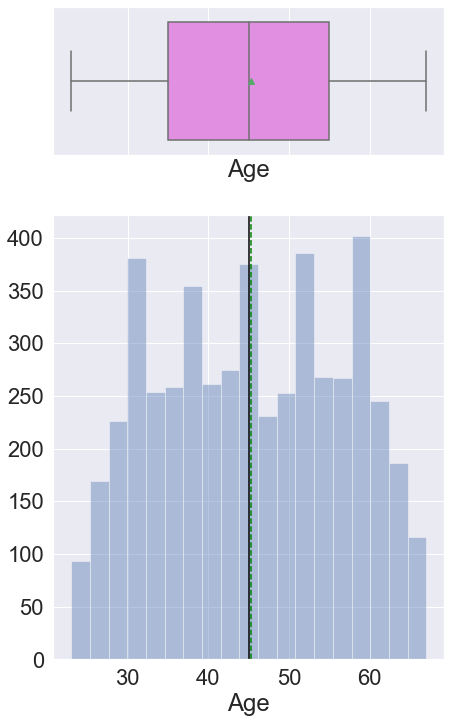

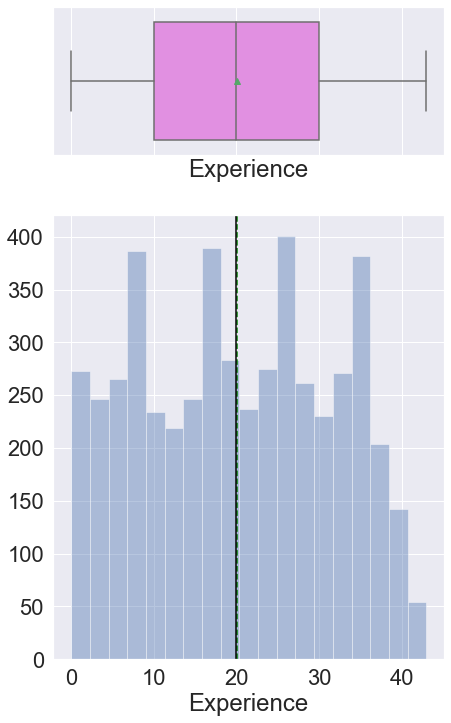

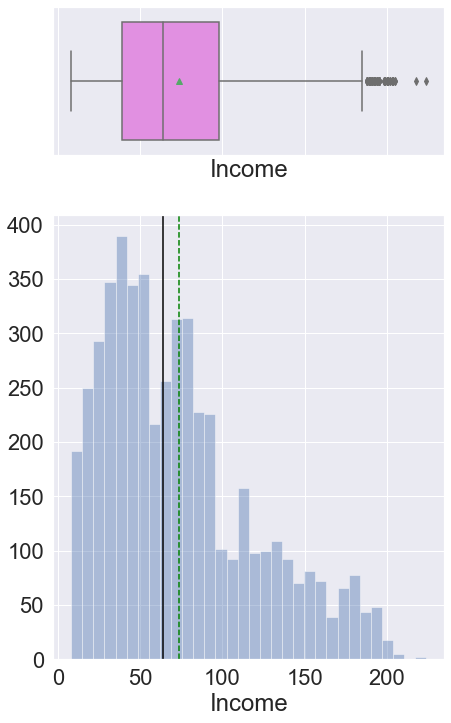

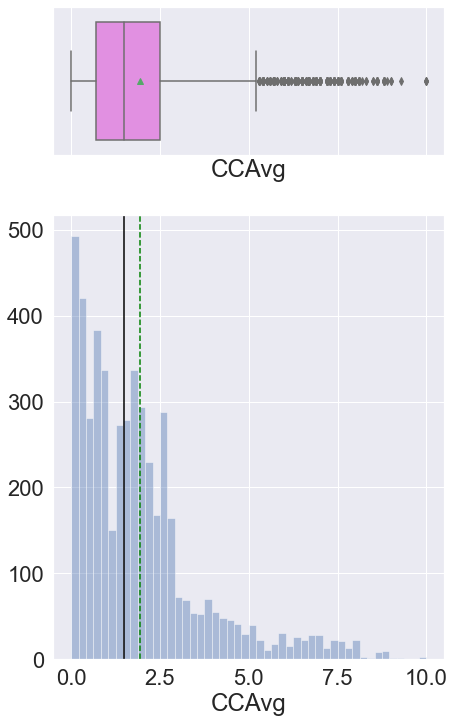

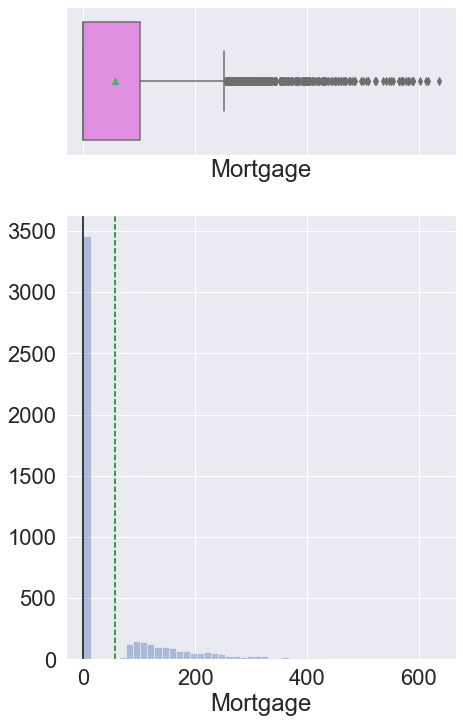

...

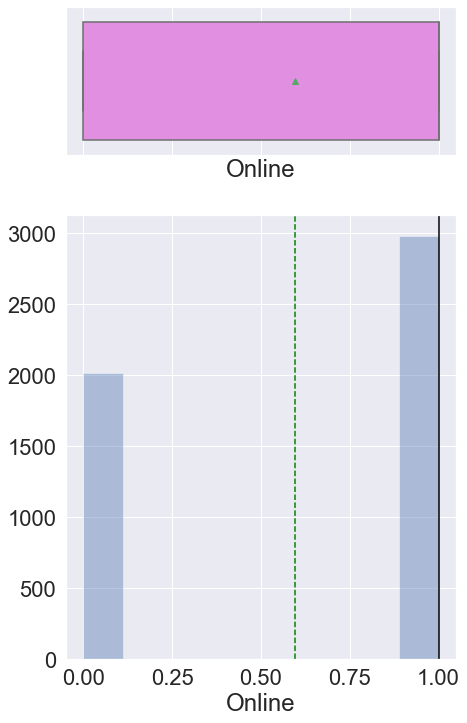

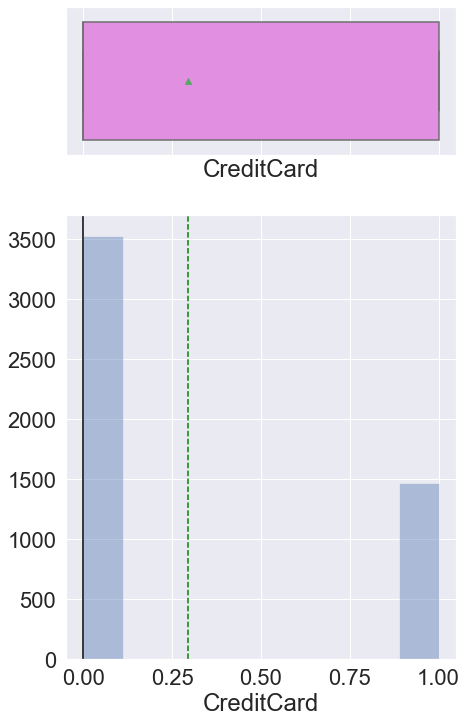

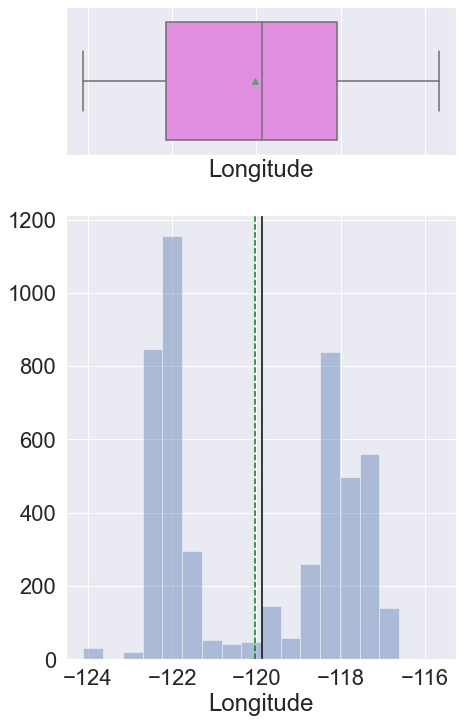

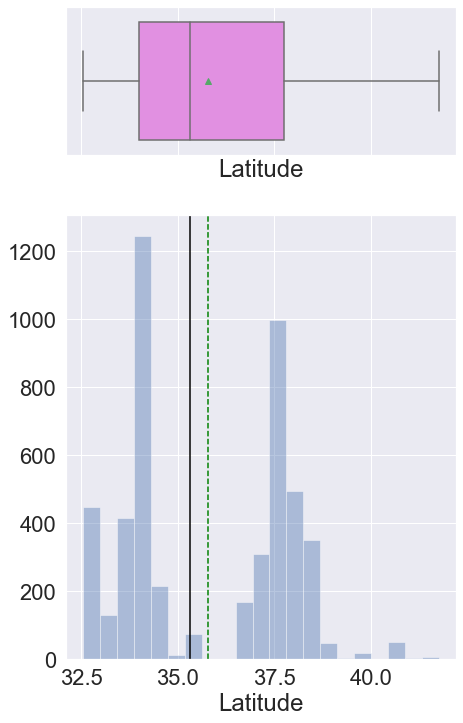

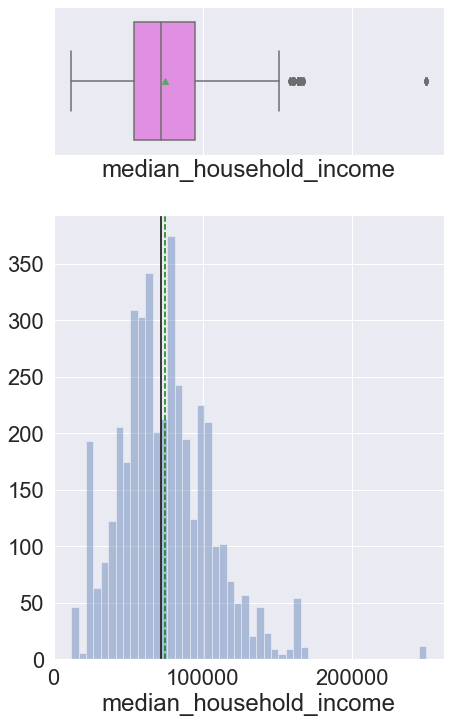

<IPython.core.display.Javascript object>

In [36]:
num_col = df.select_dtypes(include=np.number).columns.tolist()

for col in num_col:
    histogram_boxplot(df[col])

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    Here we can see that there are some spikes in certain ages and experience. If it wasn't for these spikes, the data would be fairly flat across the top. Income is skewed to the right which we saw before when more than 75% of the income was below \$98,000 but the max value spiked up to $214,000. CCAvg is also right skewed. Mortgage is displayed very oddly since there are 3,462 zeros.  Personal Loan, Securities Account, CD Account, Online, Credit Card are all boolean values. I did think that the median household income was really interesting. It appears to be almost normally distributed with a slight right skewedness. 

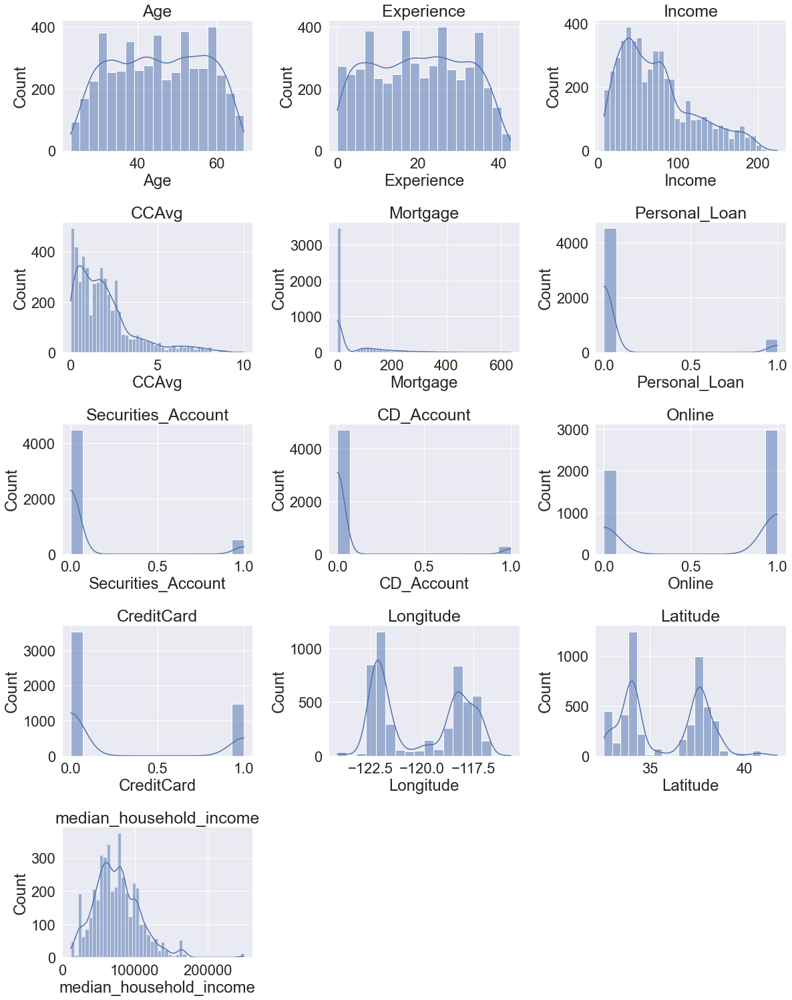

<IPython.core.display.Javascript object>

In [37]:
# lets plot histogram of all numerical variables

all_col = df.select_dtypes(include=np.number).columns.tolist()
plt.figure(figsize=(17, 75))

for i in range(len(all_col)):
    plt.subplot(18, 3, i + 1)
    # plt.hist(df[all_col[i]])
    sns.histplot(
        df[all_col[i]], kde=True
    )  # you can comment the previous line and run this one to get distribution curves
    plt.tight_layout()
    plt.title(all_col[i], fontsize=25)

plt.show()

In [38]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

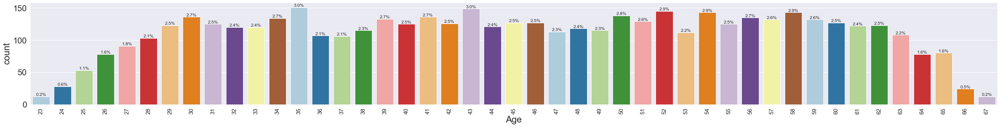

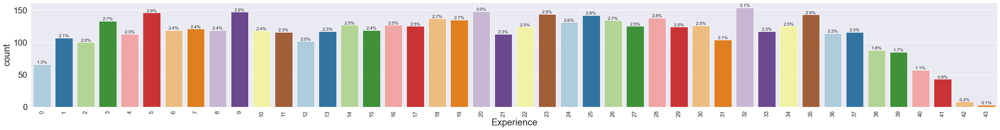

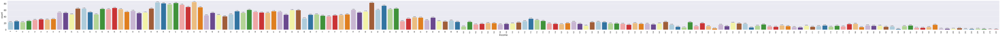

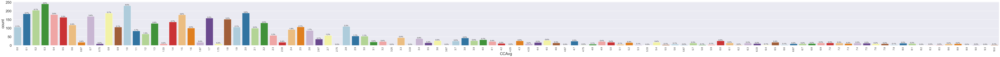

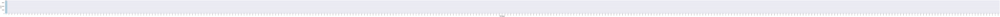

...

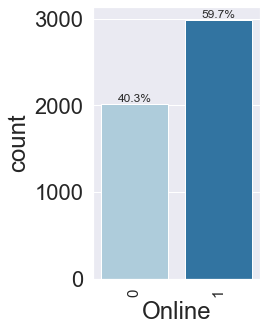

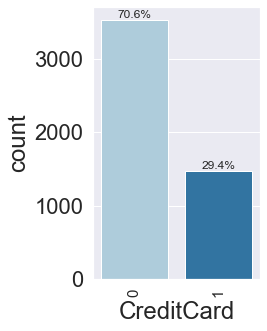

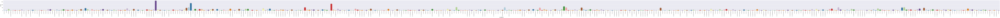

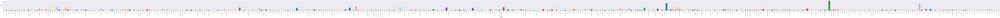

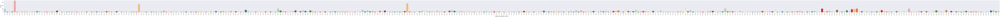

<IPython.core.display.Javascript object>

In [39]:
for col in num_col:
    labeled_barplot(df, col, perc=True)

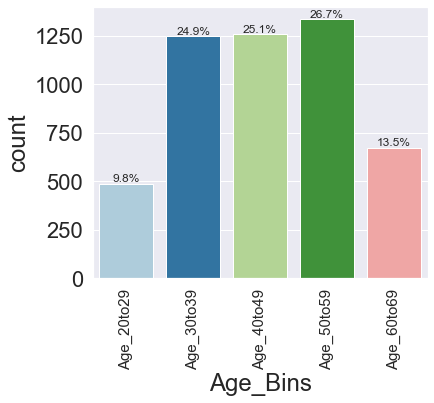

<IPython.core.display.Javascript object>

In [40]:
labeled_barplot(df, "Age_Bins", perc=True)

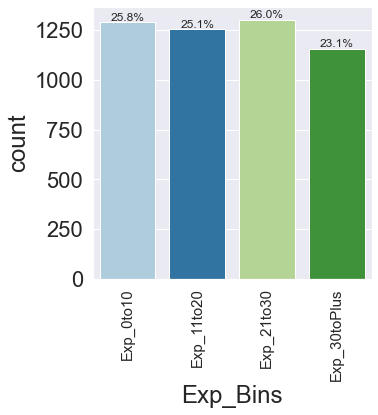

<IPython.core.display.Javascript object>

In [41]:
labeled_barplot(df, "Exp_Bins", perc=True)

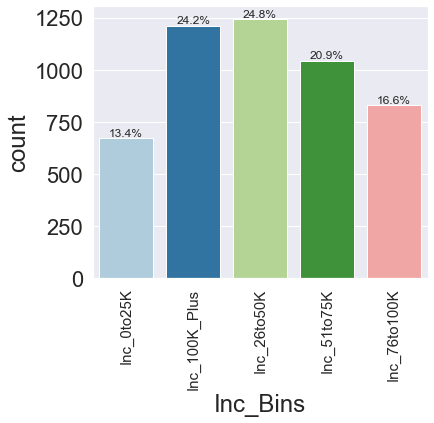

<IPython.core.display.Javascript object>

In [42]:
labeled_barplot(df, "Inc_Bins", perc=True)

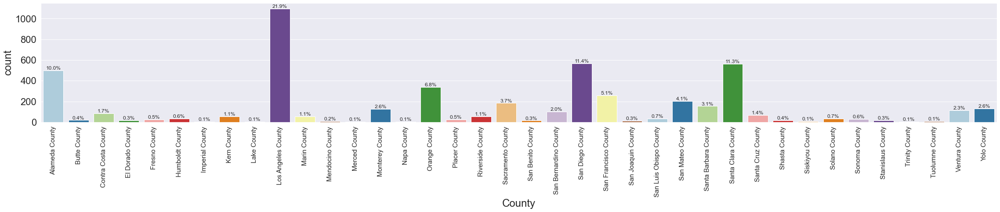

<IPython.core.display.Javascript object>

In [43]:
labeled_barplot(df, "County", perc=True)

In [44]:
import folium

# Coordinates for base map of US
USA = [36.7783, -119.4179]
Map = folium.Map(USA, zoom_start=6, tiles="Stamen Terrain")

for i in range(0, len(df)):
    folium.Marker(
        [df.iloc[i]["Latitude"], df.iloc[i]["Longitude"]],
        popup=[
            df.iloc[i]["City"],
            df.iloc[i]["County"],
            df.iloc[i]["median_household_income"],
        ],
    ).add_to(Map)

Map

<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-weight:bold;font-size:1.25em;color:black" >
    Log Transformation

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    I wanted to see what would happen if I tried to take the log of Mortgage. Here we can see the different option didn't change the way the distribution looked. I thought this might happen but I wanted to try and see. 

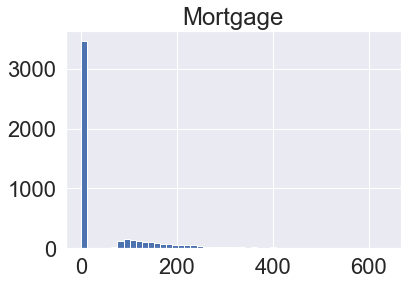

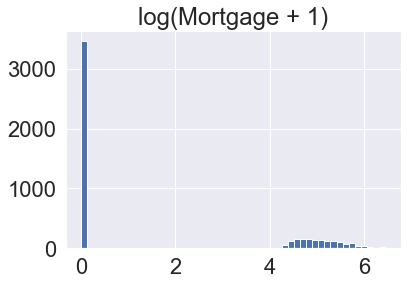

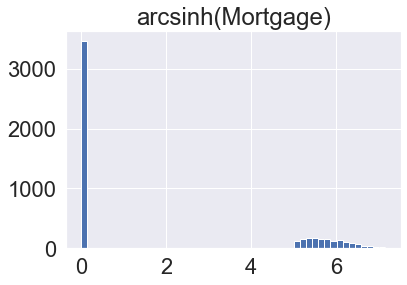

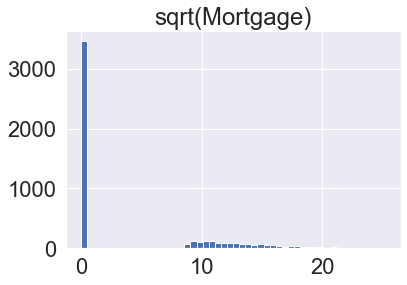

<IPython.core.display.Javascript object>

In [45]:
plt.hist(df["Mortgage"], 50)
plt.title("Mortgage")
plt.show()
plt.hist(np.log(df["Mortgage"] + 1), 50)
plt.title("log(Mortgage + 1)")
plt.show()
plt.hist(np.arcsinh(df["Mortgage"]), 50)
plt.title("arcsinh(Mortgage)")
plt.show()
plt.hist(np.sqrt(df["Mortgage"]), 50)
plt.title("sqrt(Mortgage)")
plt.show()

<span style="font-family: Helvetica;font-weight:bold;font-size:1.25em;color:black" >
    Bivariate Analysis

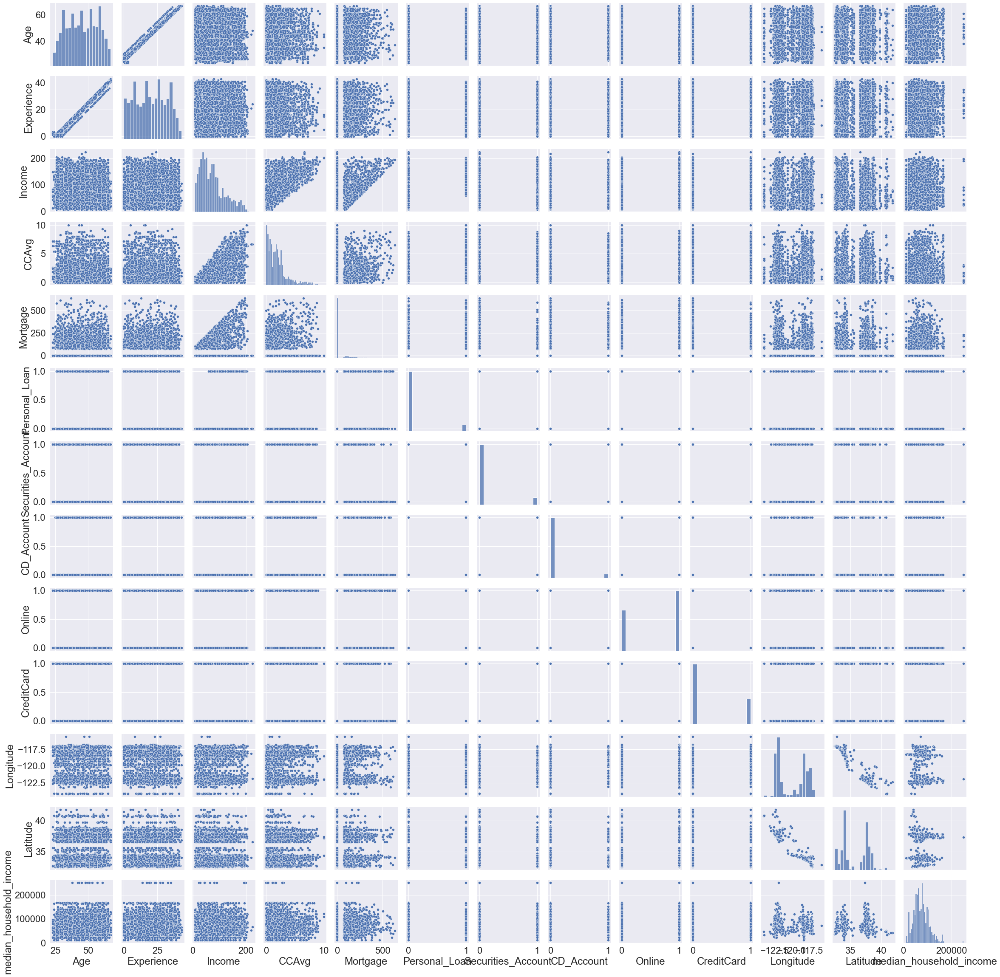

<IPython.core.display.Javascript object>

In [46]:
sns.pairplot(data=df)

In [47]:
df.corr()

,Age,Experience,Income,CCAvg,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Longitude,Latitude,median_household_income
Age,1.000000,0.993991,-0.055269,-0.052012,-0.012539,-0.007726,-0.000436,0.008043,0.013702,0.007681,0.018560,-0.024288,0.024439
Experience,0.993991,1.000000,-0.046876,-0.049738,-0.011097,-0.008304,-0.000989,0.009735,0.014051,0.008851,0.019530,-0.025024,0.024099
Income,-0.055269,-0.046876,1.000000,0.645984,0.206806,0.502462,-0.002616,0.169738,0.014206,-0.002385,0.016684,-0.026597,0.039179
CCAvg,-0.052012,-0.049738,0.645984,1.000000,0.109905,0.366889,0.015086,0.136534,-0.003611,-0.006689,0.006470,-0.015820,0.025563
Mortgage,-0.012539,-0.011097,0.206806,0.109905,1.000000,0.142095,-0.005411,0.089311,-0.005995,-0.007231,0.002402,-0.001526,0.003189
Personal_Loan,-0.007726,-0.008304,0.502462,0.366889,0.142095,1.000000,0.021954,0.316355,0.006278,0.002802,-0.001711,-0.006482,-0.000318
Securities_Account,-0.000436,-0.000989,-0.002616,0.015086,-0.005411,0.021954,1.000000,0.317034,0.012627,-0.015028,-0.002653,-0.002881,0.006124
CD_Account,0.008043,0.009735,0.169738,0.136534,0.089311,0.316355,0.317034,1.000000,0.175880,0.278644,-0.031453,0.025593,-0.013494
Online,0.013702,0.014051,0.014206,-0.003611,-0.005995,0.006278,0.012627,0.175880,1.000000,0.004210,-0.019259,0.030391,0.008912
CreditCard,0.007681,0.008851,-0.002385,-0.006689,-0.007231,0.002802,-0.015028,0.278644,0.004210,1.000000,-0.020718,0.015257,0.011088


<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    Here were can see that Age and Experience are highly coorelated. It looks like Income is highly coorelated with CCAvg and Mortgage, but when we look at the numbers the correlation is only a 0.65 and 0.21 respectively. 

In [48]:
df.corr()["Personal_Loan"]
df.corr().sort_values(by="Personal_Loan", ascending=False)["Personal_Loan"]

Personal_Loan              1.000000
Income                     0.502462
CCAvg                      0.366889
CD_Account                 0.316355
Mortgage                   0.142095
Securities_Account         0.021954
Online                     0.006278
CreditCard                 0.002802
median_household_income   -0.000318
Longitude                 -0.001711
Latitude                  -0.006482
Age                       -0.007726
Experience                -0.008304
Name: Personal_Loan, dtype: float64

<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-size:1.0em;color:black" >
    Looking at the coorelation from Personal Loan shows there are not any super highly coorelated variables.  

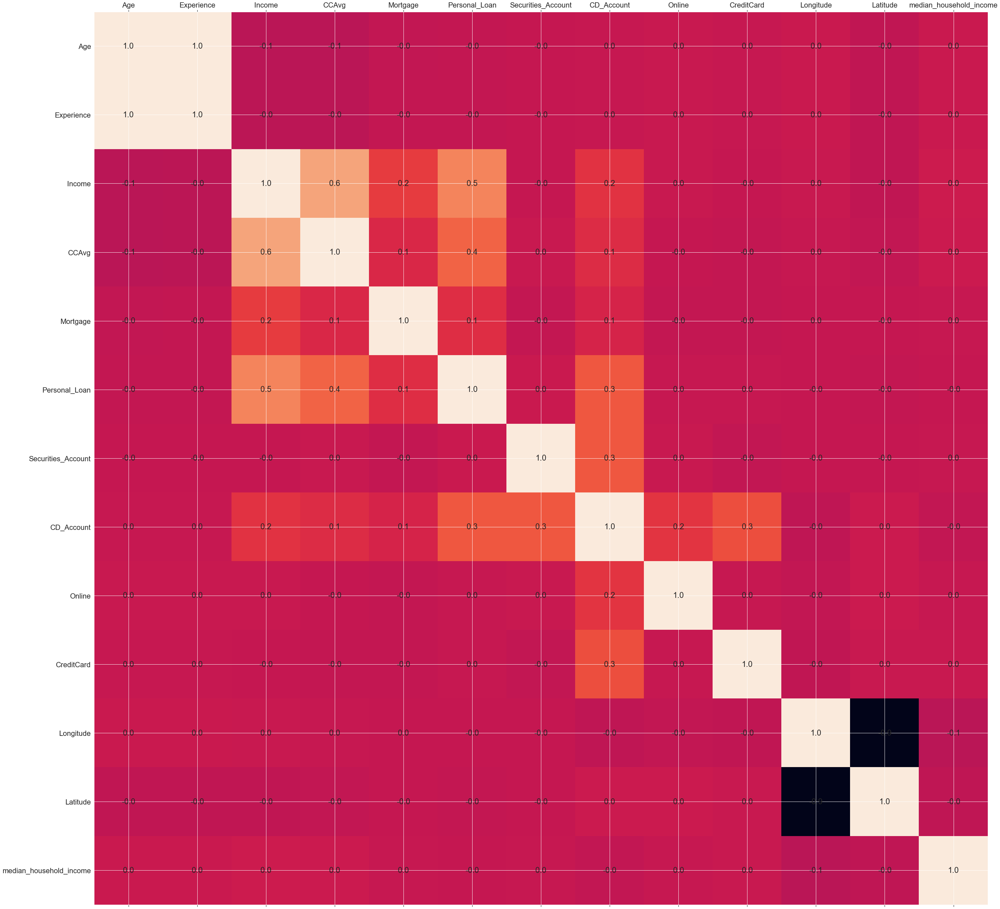

<IPython.core.display.Javascript object>

In [49]:
# However we want to see correlation in graphical representation so below is function for that
def plot_corr(df, size=50):
    corr = df.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)
    for (i, j), z in np.ndenumerate(corr):
        ax.text(j, i, "{:0.1f}".format(z), ha="center", va="center")


plot_corr(df)

<AxesSubplot:xlabel='CCAvg', ylabel='Age'>

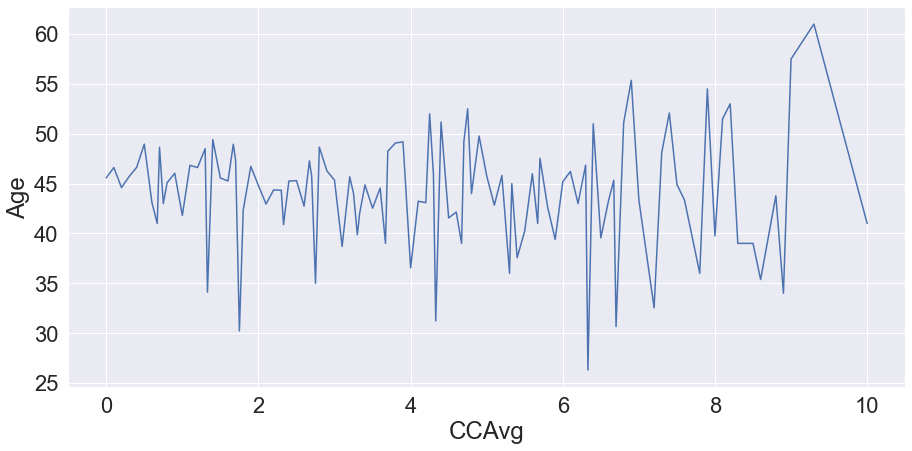

<IPython.core.display.Javascript object>

In [51]:
plt.figure(figsize=(15, 7))
sns.lineplot(x="CCAvg", y="Age", data=df, ci=None)

<AxesSubplot:xlabel='median_household_income', ylabel='County'>

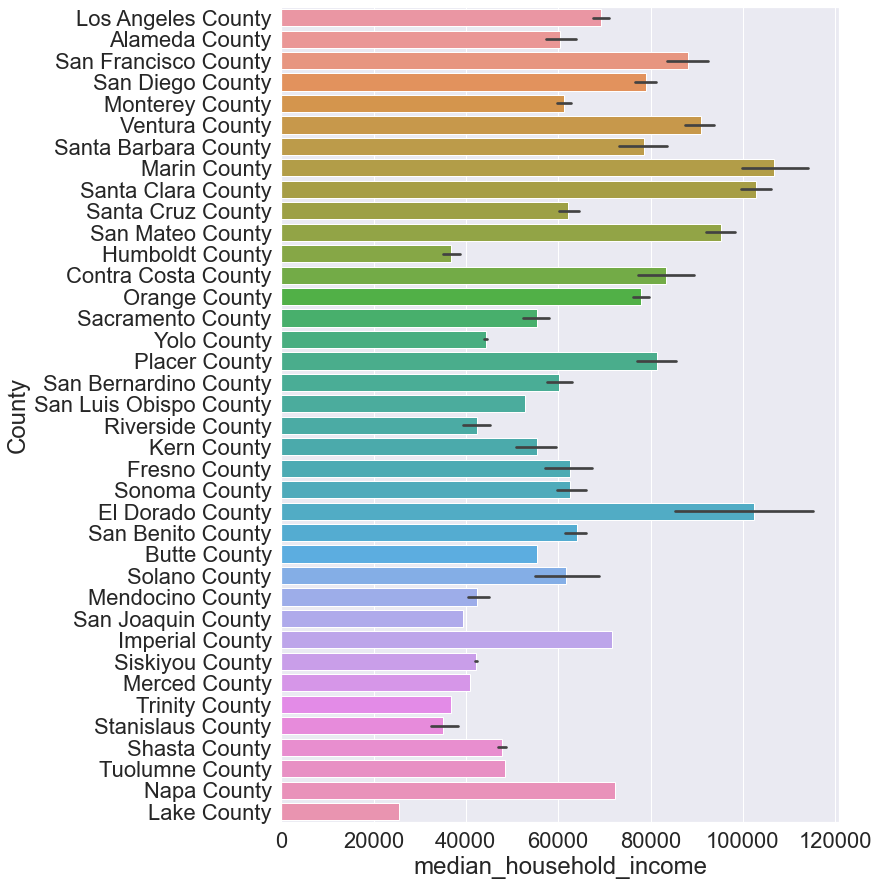

<IPython.core.display.Javascript object>

In [52]:
plt.figure(figsize=(10, 15))
sns.barplot(data=df, x="median_household_income", y="County")

<AxesSubplot:xlabel='Exp_Bins', ylabel='Experience'>

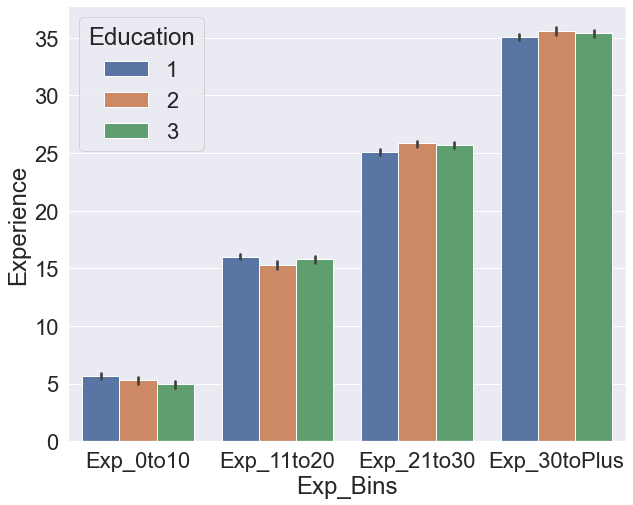

<IPython.core.display.Javascript object>

In [53]:
plt.figure(figsize=(10, 8))
sns.barplot(data=df, x="Exp_Bins", y="Experience", hue="Education")

<AxesSubplot:xlabel='Exp_Bins', ylabel='Experience'>

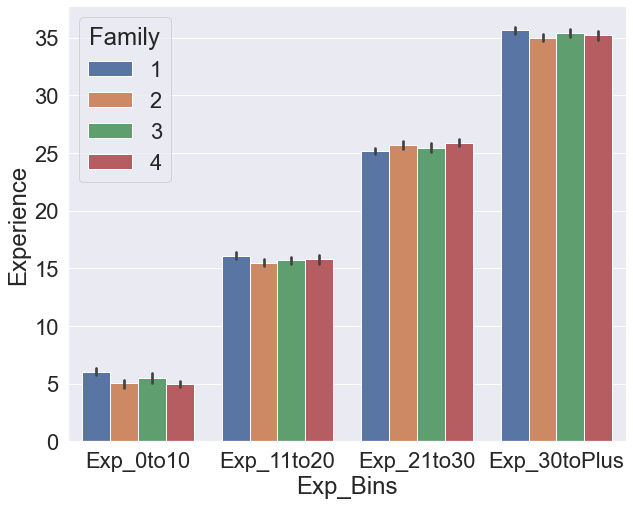

<IPython.core.display.Javascript object>

In [54]:
plt.figure(figsize=(10, 8))
sns.barplot(data=df, x="Exp_Bins", y="Experience", hue="Family")

<AxesSubplot:xlabel='Age_Bins', ylabel='Experience'>

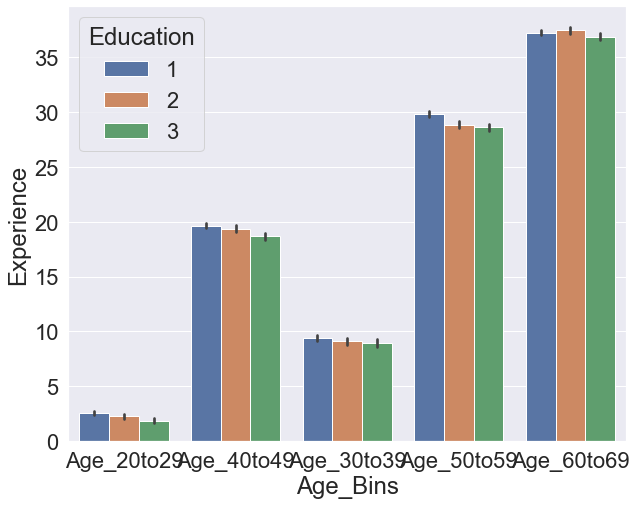

<IPython.core.display.Javascript object>

In [55]:
plt.figure(figsize=(10, 8))
sns.barplot(data=df, x="Age_Bins", y="Experience", hue="Education")

<AxesSubplot:xlabel='Age_Bins', ylabel='Experience'>

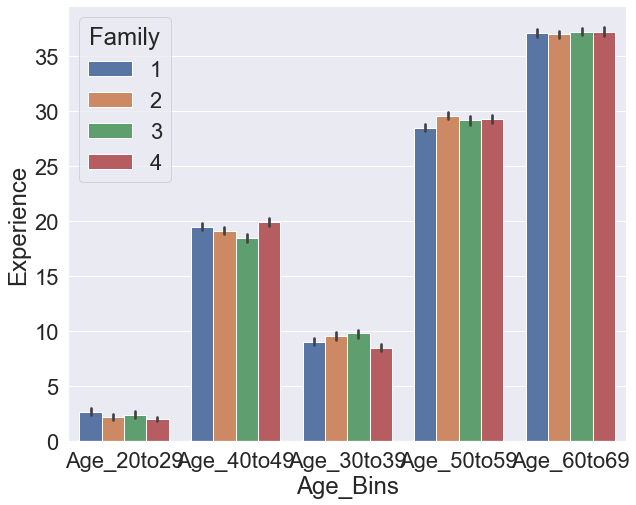

<IPython.core.display.Javascript object>

In [56]:
plt.figure(figsize=(10, 8))
sns.barplot(data=df, x="Age_Bins", y="Experience", hue="Family")

<a style="font-family: Helvetica; font-weight:bold;font-size:1.5em;color:#581845"
   name='link5'>5. Model Evaluation Criterion </a>

**Model can make wrong predictions as:**
1. Predicting a customer is not going to purchase a loan but in reality the customer will purchase a loan. -Loss of Resources.
2. Predicting a customer is going to purchase a loan but in reality the customer will not purchase a loan. -Loss of Revenue. 
    
**Which loss is greater?
- In this case, I would go with number 2 because there will be a loss of revenue that is being counted on to make a difference. 

**How to reduce this loss?**
- The company will want to make sure they reduce their false negatives. 


In [57]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification_statsmodels(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred_temp = model.predict(predictors) > threshold
    # rounding off the above values to get classes
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

In [58]:
# defining a function to plot the confusion_matrix of a classification model


def confusion_matrix_statsmodels(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    y_pred = model.predict(predictors) > threshold
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

<span style="font-family: Helvetica;font-weight:bold;font-size:1.25em;color:black" >
    Data Preparation

In [59]:
# checking for null values
df["median_household_income"].isnull().sum()

795

<IPython.core.display.Javascript object>

In [60]:
# Dropping 'median_household_income' because I created it and there are null values
df.drop("median_household_income", axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [61]:
# Creating a copy so it is easier to go back and do a different model dropping different variables.
df2 = df.copy()

<IPython.core.display.Javascript object>

In [62]:
X = df2.drop("Personal_Loan", axis=1)
y = df2["Personal_Loan"]

# creating dummy variables
X = pd.get_dummies(X, drop_first=True)

# splitting in training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

<IPython.core.display.Javascript object>

### Logistic Regression (with Sklearn library)

In [63]:
# There are different solvers available in Sklearn logistic regression
# The newton-cg solver is faster for high-dimensional data

model = LogisticRegression(solver="newton-cg", random_state=1)
lg = model.fit(X_train, y_train)

<IPython.core.display.Javascript object>

#### Checking performance on training set

In [64]:
# predicting on training set
y_pred_train = lg.predict(X_train)

<IPython.core.display.Javascript object>

In [65]:
print("Training set performance:")
print("Accuracy:", accuracy_score(y_train, y_pred_train))
print("Precision:", precision_score(y_train, y_pred_train))
print("Recall:", recall_score(y_train, y_pred_train))
print("F1:", f1_score(y_train, y_pred_train))

Training set performance:
Accuracy: 0.9788571428571429
Precision: 0.9446366782006921
Recall: 0.824773413897281
F1: 0.8806451612903228


<IPython.core.display.Javascript object>

#### Checking performance on test set

In [66]:
# predicting on the test set
y_pred_test = lg.predict(X_test)

<IPython.core.display.Javascript object>

In [67]:
print("Test set performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_test))
print("Precision:", precision_score(y_test, y_pred_test))
print("Recall:", recall_score(y_test, y_pred_test))
print("F1:", f1_score(y_test, y_pred_test))

Test set performance:
Accuracy: 0.9553333333333334
Precision: 0.8867924528301887
Recall: 0.6308724832214765
F1: 0.7372549019607842


<IPython.core.display.Javascript object>

**Observations**

- The training and testing recall are 82.4% and 63.1% respectively.

- Recall on the train and test sets are not comparable.

- This shows that the model is not giving a generalized result.


### Logistic Regression (with statsmodels library)

In [68]:
X = df2.drop("Personal_Loan", axis=1)
y = df2["Personal_Loan"]

# creating dummy variables
X = pd.get_dummies(X, drop_first=True)

# adding constant
X = sm.add_constant(X)

# splitting in training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

<IPython.core.display.Javascript object>

In [69]:
logit = sm.Logit(y_train, X_train.astype(float))
lg = logit.fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(lg.summary())

LinAlgError: Singular matrix

<IPython.core.display.Javascript object>

**Observations**

- This error shows there is multicollinearity present in the data.

In [71]:
# creating a new copy to reduce multicollinearity
df3 = df2.copy()

<IPython.core.display.Javascript object>

In [72]:
# Dropping variable Latitude and Longitude since I created these for the map
df3.drop("Latitude", axis=1, inplace=True)
df3.drop("Longitude", axis=1, inplace=True)
df3.drop("Experience", axis=1, inplace=True)

<IPython.core.display.Javascript object>

After running the VIF test, the first time I found that Age and Experience had a very high score. Therefore, I dropped Experience. 

In [73]:
df3.drop("Age_Bins", axis=1, inplace=True)
df3.drop("Exp_Bins", axis=1, inplace=True)
df3.drop("Inc_Bins", axis=1, inplace=True)

<IPython.core.display.Javascript object>

There were also high scores between the bins I created and the original columns. So first I am trying to drop the bin columns I created. 

In [74]:
df3.drop("City", axis=1, inplace=True)
df3.drop("ZIPCode", axis=1, inplace=True)

<IPython.core.display.Javascript object>

After that, there was a high score between City, County, and ZIPCode.

In [75]:
X = df3.drop("Personal_Loan", axis=1)
y = df3["Personal_Loan"]

# creating dummy variables
X = pd.get_dummies(X, drop_first=True)

# adding constant
X = sm.add_constant(X)

# splitting in training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

<IPython.core.display.Javascript object>

In [76]:
logit = sm.Logit(y_train, X_train.astype(float))
lg = logit.fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(lg.summary())

                           Logit Regression Results                           
Dep. Variable:          Personal_Loan   No. Observations:                 3500
Model:                          Logit   Df Residuals:                     3449
Method:                           MLE   Df Model:                           50
Date:                Sat, 31 Jul 2021   Pseudo R-squ.:                  0.6692
Time:                        09:10:03   Log-Likelihood:                -362.37
converged:                      False   LL-Null:                       -1095.5
Covariance Type:            nonrobust   LLR p-value:                4.051e-274
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                           -13.8852      0.925    -15.014      0.000     -15.698     -12.073
Age                               0.0046      0.009      0.521      0.602 

<IPython.core.display.Javascript object>

**Observations**

- Negative values of the coefficient shows that probability of customer not purchasing a loan decreases with the increase of corresponding attribute value.

- Positive values of the coefficient show that that probability of customer purchasing a loan increases with the increase of corresponding attribute value.

- p-value of a variable indicates if the variable is significant or not. If we consider the significance level to be 0.05 (5%), then any variable with a p-value less than 0.05 would be considered significant.
    - Income, CCAvg, CD_Account, Online, CreditCard, Family_3, Family_4, Education_2, Education_3, County_Riverside County, and County_San Mateo all have values below 0.05.   

- But these variables might contain multicollinearity, which will affect the p-values.

* We will have to remove multicollinearity from the data to get reliable coefficients and p-values.

* There are different ways of detecting (or testing) multi-collinearity, one such way is the Variation Inflation Factor.

### Additional Information on VIF

* **Variance  Inflation  factor**:  Variance  inflation  factors  measure  the  inflation  in  the variances of the regression coefficients estimates due to collinearity that exist among the  predictors.  It  is  a  measure  of  how  much  the  variance  of  the  estimated  regression coefficient βk is "inflated" by  the  existence  of  correlation  among  the  predictor variables in the model. 

* General Rule of thumb: If VIF is 1 then there is no correlation among the kth predictor and the remaining predictor variables, and  hence  the variance of β̂k is not inflated at all. Whereas if VIF exceeds 5, we say there is moderate VIF and if it is 10 or exceeding 10, it shows signs of high multi-collinearity. But the purpose of the analysis should dictate which threshold to use. 

In [77]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

const                            36.209113
Age                               1.026204
Income                            1.913727
CCAvg                             1.755454
Mortgage                          1.060962
Securities_Account                1.157801
CD_Account                        1.373245
Online                            1.055760
CreditCard                        1.125206
Family_2                          1.420281
Family_3                          1.396617
Family_4                          1.441933
Education_2                       1.302912
Education_3                       1.264973
County_Butte County               1.033779
County_Contra Costa County        1.131617
County_El Dorado County           1.028104
County_Fresno County              1.032622
County_Humboldt County            1.059178
County_Imperial County            1.006696
County_Kern County                1.088149
County_Lake County                1.013082
County_Los Angeles 

<IPython.core.display.Javascript object>

With the multicollinearity removed, I want to try the df2 dataframe on the Logistic Regression (with Sklearn library)

In [78]:
X = df3.drop("Personal_Loan", axis=1)
Y = df3["Personal_Loan"]

# creating dummy variables
X = pd.get_dummies(X, drop_first=True)

# splitting in training and test set
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)

<IPython.core.display.Javascript object>

In [79]:
# There are different solvers available in Sklearn logistic regression
# The newton-cg solver is faster for high-dimensional data

model = LogisticRegression(solver="newton-cg", random_state=1)
lg = model.fit(X_train, y_train)

<IPython.core.display.Javascript object>

In [80]:
# predicting on training set
y_pred_train = lg.predict(X_train)

<IPython.core.display.Javascript object>

In [81]:
print("Training set performance:")
print("Accuracy:", accuracy_score(y_train, y_pred_train))
print("Precision:", precision_score(y_train, y_pred_train))
print("Recall:", recall_score(y_train, y_pred_train))
print("F1:", f1_score(y_train, y_pred_train))

Training set performance:
Accuracy: 0.9625714285714285
Precision: 0.890625
Recall: 0.6888217522658611
F1: 0.776831345826235


<IPython.core.display.Javascript object>

In [82]:
# predicting on the test set
y_pred_test = lg.predict(X_test)

<IPython.core.display.Javascript object>

In [83]:
print("Test set performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_test))
print("Precision:", precision_score(y_test, y_pred_test))
print("Recall:", recall_score(y_test, y_pred_test))
print("F1:", f1_score(y_test, y_pred_test))

Test set performance:
Accuracy: 0.954
Precision: 0.9081632653061225
Recall: 0.5973154362416108
F1: 0.7206477732793521


<IPython.core.display.Javascript object>

**Observations**

- The training and testing recall are 68.9% and 59.7% respectively.

- Recall on the train and test sets are comparable.

- This shows that the model is giving a generalised result.


Now, since none of the variables exhibit high multicollinearity, we know the values in the summary are reliable.
Now we can remove the insignificant features. 
To start with I am going to remove the 4 counties that had a p-value of 1.000.

In [84]:
X_train1 = X_train.drop(
    [
        "County_Tuolumne County",
        "County_Siskiyou County",
        "County_Lake County",
        "County_Butte County",
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [85]:
logit1 = sm.Logit(y_train, X_train1.astype(float))
lg1 = logit1.fit(disp=False)
print(lg1.summary())

LinAlgError: Singular matrix

<IPython.core.display.Javascript object>

Hmmmm, I have multicolinarity problems again.

In [86]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train1.values, i) for i in range(X_train1.shape[1])],
    index=X_train1.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

Age                              8.936005
Income                           6.321509
CCAvg                            3.924280
Mortgage                         1.385515
Securities_Account               1.278596
CD_Account                       1.427649
Online                           2.450954
CreditCard                       1.568050
Family_2                         1.839717
Family_3                         1.672866
Family_4                         1.767683
Education_2                      1.712631
Education_3                      1.721033
County_Contra Costa County       1.106053
County_El Dorado County          1.024077
County_Fresno County             1.027945
County_Humboldt County           1.045321
County_Imperial County           1.006319
County_Kern County               1.070583
County_Los Angeles County        2.459142
County_Marin County              1.076028
County_Mendocino County          1.021045
County_Merced County             1.007638

<IPython.core.display.Javascript object>

Here we can see that age has the highest score over 5. 

In [87]:
X_train1 = X_train.drop(
    [
        "Age",
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [88]:
logit1 = sm.Logit(y_train, X_train1.astype(float))
lg1 = logit1.fit(disp=False)
print(lg1.summary())

                           Logit Regression Results                           
Dep. Variable:          Personal_Loan   No. Observations:                 3500
Model:                          Logit   Df Residuals:                     3451
Method:                           MLE   Df Model:                           48
Date:                Sat, 31 Jul 2021   Pseudo R-squ.:                  0.2444
Time:                        09:10:25   Log-Likelihood:                -827.73
converged:                      False   LL-Null:                       -1095.5
Covariance Type:            nonrobust   LLR p-value:                 1.547e-83
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Income                            0.0173      0.002     10.533      0.000       0.014       0.021
CCAvg                             0.1009      0.041      2.477      0.013 

<IPython.core.display.Javascript object>

In [89]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train1.values, i) for i in range(X_train1.shape[1])],
    index=X_train1.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

Income                           6.072085
CCAvg                            3.926404
Mortgage                         1.387149
Securities_Account               1.273257
CD_Account                       1.415578
Online                           2.352687
CreditCard                       1.535435
Family_2                         1.772369
Family_3                         1.597993
Family_4                         1.720229
Education_2                      1.660475
Education_3                      1.618522
County_Butte County              1.021538
County_Contra Costa County       1.084689
County_El Dorado County          1.020408
County_Fresno County             1.021808
County_Humboldt County           1.032392
County_Imperial County           1.005384
County_Kern County               1.051344
County_Lake County               1.009358
County_Los Angeles County        2.054082
County_Marin County              1.056114
County_Mendocino County          1.016735

<IPython.core.display.Javascript object>

In [90]:
X_train2 = X_train1.drop(
    [
        "Income",
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [91]:
logit2 = sm.Logit(y_train, X_train2.astype(float))
lg2 = logit2.fit(disp=False)
print(lg2.summary())

LinAlgError: Singular matrix

<IPython.core.display.Javascript object>

In [92]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train2.values, i) for i in range(X_train2.shape[1])],
    index=X_train2.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

CCAvg                            2.171652
Mortgage                         1.336767
Securities_Account               1.272333
CD_Account                       1.406264
Online                           2.318033
CreditCard                       1.534374
Family_2                         1.745180
Family_3                         1.594173
Family_4                         1.719900
Education_2                      1.658458
Education_3                      1.617244
County_Butte County              1.020916
County_Contra Costa County       1.073759
County_El Dorado County          1.017994
County_Fresno County             1.019608
County_Humboldt County           1.030327
County_Imperial County           1.005337
County_Kern County               1.047412
County_Lake County               1.009210
County_Los Angeles County        1.906090
County_Marin County              1.051518
County_Mendocino County          1.011811
County_Merced County             1.001601

<IPython.core.display.Javascript object>

In [93]:
X_train2 = X_train1.drop(
    [
        "Online",
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [94]:
logit2 = sm.Logit(y_train, X_train2.astype(float))
lg2 = logit2.fit(disp=False)
print(lg2.summary())

                           Logit Regression Results                           
Dep. Variable:          Personal_Loan   No. Observations:                 3500
Model:                          Logit   Df Residuals:                     3452
Method:                           MLE   Df Model:                           47
Date:                Sat, 31 Jul 2021   Pseudo R-squ.:                  0.1590
Time:                        09:10:32   Log-Likelihood:                -921.29
converged:                      False   LL-Null:                       -1095.5
Covariance Type:            nonrobust   LLR p-value:                 1.291e-47
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Income                            0.0124      0.002      8.198      0.000       0.009       0.015
CCAvg                             0.1002      0.039      2.554      0.011 

<IPython.core.display.Javascript object>

In [95]:
X_train3 = X_train2.drop(
    [
        "County_Tuolumne County",
        "County_San Benito County",
        "County_Lake County",
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [96]:
logit3 = sm.Logit(y_train, X_train3.astype(float))
lg3 = logit3.fit(disp=False)
print(lg3.summary())

LinAlgError: Singular matrix

<IPython.core.display.Javascript object>

In [97]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train3.values, i) for i in range(X_train3.shape[1])],
    index=X_train3.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

Income                           5.972958
CCAvg                            3.925342
Mortgage                         1.383419
Securities_Account               1.270937
CD_Account                       1.384173
CreditCard                       1.530634
Family_2                         1.753793
Family_3                         1.577504
Family_4                         1.688133
Education_2                      1.637637
Education_3                      1.608395
County_Butte County              1.015615
County_Contra Costa County       1.069878
County_El Dorado County          1.018845
County_Fresno County             1.019807
County_Humboldt County           1.029027
County_Imperial County           1.004026
County_Kern County               1.043758
County_Los Angeles County        1.952123
County_Marin County              1.052912
County_Mendocino County          1.015574
County_Merced County             1.006709
County_Monterey County           1.123508

<IPython.core.display.Javascript object>

In [98]:
X_train3 = X_train2.drop(
    [
        "Income",
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [99]:
logit3 = sm.Logit(y_train, X_train3.astype(float))
lg3 = logit3.fit(disp=False)
print(lg3.summary())

LinAlgError: Singular matrix

<IPython.core.display.Javascript object>

In [100]:
vif_series = pd.Series(
    [variance_inflation_factor(X_train3.values, i) for i in range(X_train3.shape[1])],
    index=X_train3.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

CCAvg                            2.152986
Mortgage                         1.336222
Securities_Account               1.272205
CD_Account                       1.373352
CreditCard                       1.534139
Family_2                         1.726247
Family_3                         1.573291
Family_4                         1.694734
Education_2                      1.647720
Education_3                      1.612918
County_Butte County              1.014736
County_Contra Costa County       1.057030
County_El Dorado County          1.016267
County_Fresno County             1.017362
County_Humboldt County           1.026839
County_Imperial County           1.003974
County_Kern County               1.039274
County_Lake County               1.008325
County_Los Angeles County        1.793411
County_Marin County              1.048517
County_Mendocino County          1.010269
County_Merced County             1.001569
County_Monterey County           1.111825

<IPython.core.display.Javascript object>

In [101]:
X_train3 = X_train2.drop(
    [
        "CCAvg",
    ],
    axis=1,
)

<IPython.core.display.Javascript object>

In [102]:
logit3 = sm.Logit(y_train, X_train3.astype(float))
lg3 = logit3.fit(disp=False)
print(lg3.summary())

                           Logit Regression Results                           
Dep. Variable:          Personal_Loan   No. Observations:                 3500
Model:                          Logit   Df Residuals:                     3453
Method:                           MLE   Df Model:                           46
Date:                Sat, 31 Jul 2021   Pseudo R-squ.:                  0.1563
Time:                        09:10:40   Log-Likelihood:                -924.23
converged:                      False   LL-Null:                       -1095.5
Covariance Type:            nonrobust   LLR p-value:                 6.045e-47
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Income                            0.0149      0.001     12.852      0.000       0.013       0.017
Mortgage                       -1.35e-05      0.001     -0.025      0.980 

<IPython.core.display.Javascript object>

I feel like I need to start over with the original df dataframe and then try dropping other variables. I am not sure how I would do that. Would I just do another xtrain and equal it to df? I will try this if I have time but I only have 2 hours left and need to do the decision tree.  

### Decision Tree

In [103]:
df4 = df.copy()
df4.drop(["ZIPCode", "City", "Longitude", "Latitude"], axis=1, inplace=True)
df4 = pd.get_dummies(df4)
df4.head(10)

,Age,Experience,Income,CCAvg,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,Family_1,Family_2,Family_3,Family_4,Education_1,Education_2,Education_3,Age_Bins_Age_20to29,Age_Bins_Age_30to39,Age_Bins_Age_40to49,Age_Bins_Age_50to59,Age_Bins_Age_60to69,Exp_Bins_Exp_0to10,Exp_Bins_Exp_11to20,Exp_Bins_Exp_21to30,Exp_Bins_Exp_30toPlus,Inc_Bins_Inc_0to25K,Inc_Bins_Inc_100K_Plus,Inc_Bins_Inc_26to50K,Inc_Bins_Inc_51to75K,Inc_Bins_Inc_76to100K,County_Alameda County,County_Butte County,County_Contra Costa County,County_El Dorado County,County_Fresno County,County_Humboldt County,County_Imperial County,County_Kern County,County_Lake County,County_Los Angeles County,County_Marin County,County_Mendocino County,County_Merced County,County_Monterey County,County_Napa County,County_Orange County,County_Placer County,County_Riverside County,County_Sacramento County,County_San Benito County,County_San Bernardino County,County_San Diego County,County_San Francisco County,County_San Joaquin County,County_San Luis Obispo County,County_San Mateo County,County_Santa Barbara County,County_Santa Clara County,County_Santa Cruz County,County_Shasta County,County_Siskiyou County,County_Solano County,County_Sonoma County,County_Stanislaus County,County_Trinity County,County_Tuolumne County,County_Ventura County,County_Yolo County
0,25,1,49,1.6,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,45,19,34,1.5,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,39,15,11,1.0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,35,9,100,2.7,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,35,8,45,1.0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,37,13,29,0.4,155,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,53,27,72,1.5,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,50,24,22,0.3,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,35,10,81,0.6,104,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,34,9,180,8.9,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


<IPython.core.display.Javascript object>

## Split Data

In [104]:
X = df4.drop("Personal_Loan", axis=1)
y = df4.pop("Personal_Loan")

<IPython.core.display.Javascript object>

In [105]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=1
)

<IPython.core.display.Javascript object>

## Build Decision Tree Model

In [106]:
dTree = DecisionTreeClassifier(criterion="gini", random_state=1)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

<IPython.core.display.Javascript object>

## Scoring our Decision Tree

In [107]:
print("Accuracy on training set : ", dTree.score(X_train, y_train))
print("Accuracy on test set : ", dTree.score(X_test, y_test))

Accuracy on training set :  1.0
Accuracy on test set :  0.976


<IPython.core.display.Javascript object>

In [108]:
# Checking number of positives
y.sum(axis=0)

480

<IPython.core.display.Javascript object>

* The ratio of positives to negatives is 4.8:5.2, so if our model marks each sample as negative, then also we'll get 97.8% accuracy, hence accuracy is a good metric to evaluate here. I feel like this is too good to be true and that my decision tree is overfitted. 

**What does a bank want?**
* A bank wants to maximize revenue - it can face 2 types of losses here: 
   * Whenever bank runs a campaign and they don't get a return on that campaign.
   * A bank doesn't run a campaign and lose out on potenital customers.

**Which loss is greater ?**
* Here the greater loss is the potential to lose customers because the campaign didn't target the correct people. 

**Since we want people to purchase a loans we should use Recall as a metric of model evaluation instead of accuracy.**

* Recall - It gives the ratio of True positives to Actual positives, so high Recall implies low false negatives, i.e. low chances of predicting a purchaser as a non purchaser.

In [109]:
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

<IPython.core.display.Javascript object>

In [110]:
## Function to create confusion matrix
def make_confusion_matrix(model, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    y_actual : ground truth

    """
    y_predict = model.predict(X_test)
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(
        cm,
        index=[i for i in ["Actual - No", "Actual - Yes"]],
        columns=[i for i in ["Predicted - No", "Predicted - Yes"]],
    )
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    plt.figure(figsize=(10, 7))
    sns.heatmap(df_cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

In [113]:
##  Function to calculate recall score
def get_recall_score(model):
    """
    model : classifier to predict values of X

    """
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    print("Recall on training set : ", metrics.recall_score(y_train, pred_train))
    print("Recall on test set : ", metrics.recall_score(y_test, pred_test))

<IPython.core.display.Javascript object>

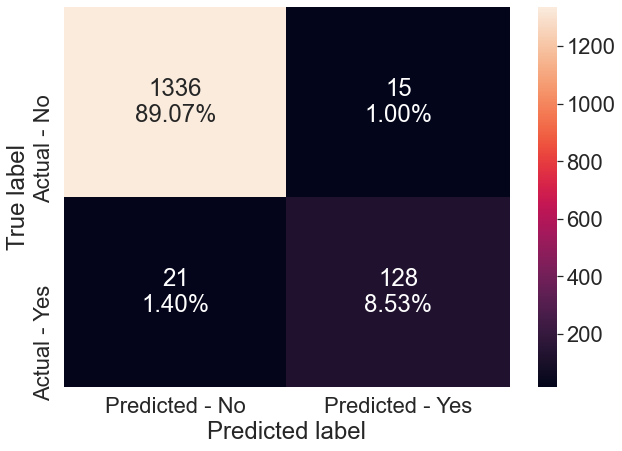

<IPython.core.display.Javascript object>

In [114]:
make_confusion_matrix(dTree, y_test)

In [115]:
# Recall on train and test
get_recall_score(dTree)

Recall on training set :  1.0
Recall on test set :  0.8590604026845637


<IPython.core.display.Javascript object>

## Visualizing the Decision Tree

In [116]:
feature_names = list(X.columns)
print(feature_names)

['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage', 'Securities_Account', 'CD_Account', 'Online', 'CreditCard', 'Family_1', 'Family_2', 'Family_3', 'Family_4', 'Education_1', 'Education_2', 'Education_3', 'Age_Bins_Age_20to29', 'Age_Bins_Age_30to39', 'Age_Bins_Age_40to49', 'Age_Bins_Age_50to59', 'Age_Bins_Age_60to69', 'Exp_Bins_Exp_0to10', 'Exp_Bins_Exp_11to20', 'Exp_Bins_Exp_21to30', 'Exp_Bins_Exp_30toPlus', 'Inc_Bins_Inc_0to25K', 'Inc_Bins_Inc_100K_Plus', 'Inc_Bins_Inc_26to50K', 'Inc_Bins_Inc_51to75K', 'Inc_Bins_Inc_76to100K', 'County_Alameda County', 'County_Butte County', 'County_Contra Costa County', 'County_El Dorado County', 'County_Fresno County', 'County_Humboldt County', 'County_Imperial County', 'County_Kern County', 'County_Lake County', 'County_Los Angeles County', 'County_Marin County', 'County_Mendocino County', 'County_Merced County', 'County_Monterey County', 'County_Napa County', 'County_Orange County', 'County_Placer County', 'County_Riverside County', 'County_Sacra

<IPython.core.display.Javascript object>

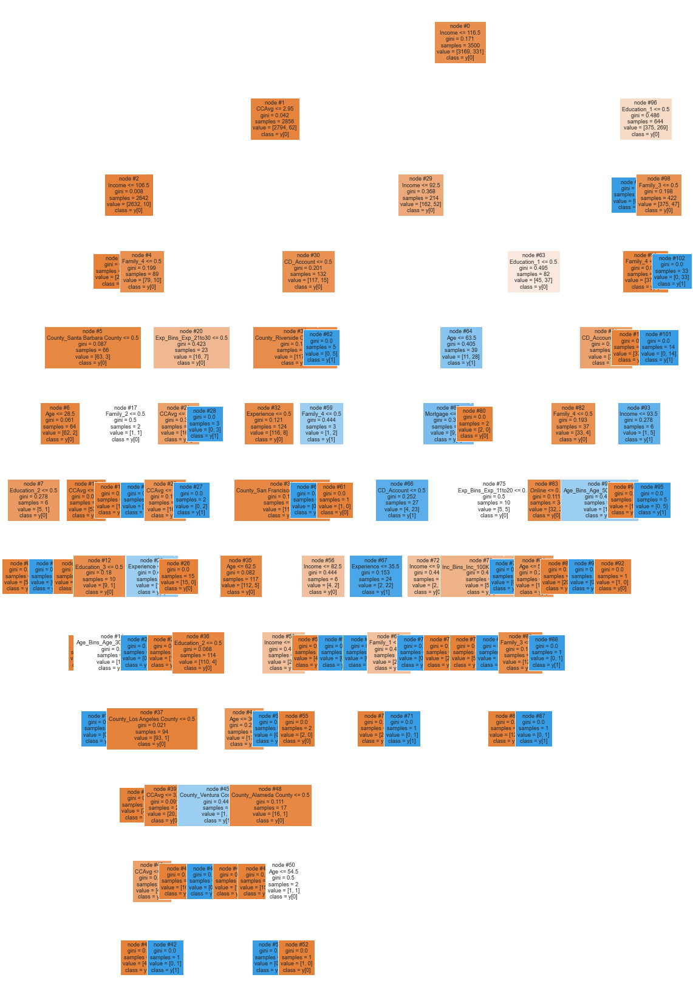

<IPython.core.display.Javascript object>

In [117]:
plt.figure(figsize=(20, 30))
tree.plot_tree(
    dTree,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
plt.show()

In [118]:
# Text report showing the rules of a decision tree -

print(tree.export_text(dTree, feature_names=feature_names, show_weights=True))

|--- Income <= 116.50
|   |--- CCAvg <= 2.95
|   |   |--- Income <= 106.50
|   |   |   |--- weights: [2553.00, 0.00] class: 0
|   |   |--- Income >  106.50
|   |   |   |--- Family_4 <= 0.50
|   |   |   |   |--- County_Santa Barbara County <= 0.50
|   |   |   |   |   |--- Age <= 28.50
|   |   |   |   |   |   |--- Education_2 <= 0.50
|   |   |   |   |   |   |   |--- weights: [5.00, 0.00] class: 0
|   |   |   |   |   |   |--- Education_2 >  0.50
|   |   |   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |   |--- Age >  28.50
|   |   |   |   |   |   |--- CCAvg <= 2.20
|   |   |   |   |   |   |   |--- weights: [48.00, 0.00] class: 0
|   |   |   |   |   |   |--- CCAvg >  2.20
|   |   |   |   |   |   |   |--- Education_3 <= 0.50
|   |   |   |   |   |   |   |   |--- weights: [8.00, 0.00] class: 0
|   |   |   |   |   |   |   |--- Education_3 >  0.50
|   |   |   |   |   |   |   |   |--- Age_Bins_Age_30to39 <= 0.50
|   |   |   |   |   |   |   |   |   |--- weights: [0.00, 1.00

<IPython.core.display.Javascript object>

In [119]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        dTree.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                                    Imp
Education_1                    0.400952
Income                         0.309494
Family_3                       0.097406
Family_4                       0.054470
CCAvg                          0.049703
CD_Account                     0.025711
Age                            0.012351
Experience                     0.009061
Exp_Bins_Exp_21to30            0.005571
Inc_Bins_Inc_100K_Plus         0.004767
Education_2                    0.003849
Exp_Bins_Exp_11to20            0.003575
County_Riverside County        0.003544
Mortgage                       0.003014
Age_Bins_Age_50to59            0.002224
Family_1                       0.002224
County_Ventura County          0.002224
Family_2                       0.001668
Age_Bins_Age_30to39            0.001668
County_San Francisco County    0.001608
County_Alameda County          0.001472
County_Santa Barbara County    0.001422
Education_3                    0.001335
Online                         0.000561


<IPython.core.display.Javascript object>

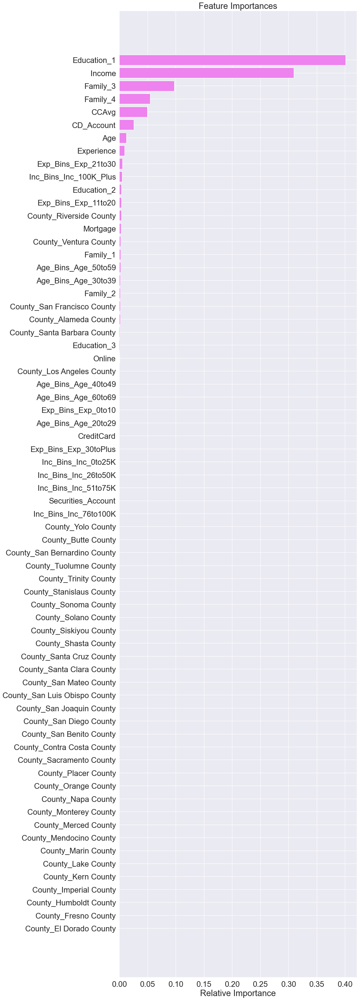

<IPython.core.display.Javascript object>

In [120]:
importances = dTree.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 50))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* According to the decision tree model, Education_1 is the most important variable for predicting whether the customer will purchase a loan or not.

## Reducing over fitting

* In general, the deeper you allow your tree to grow, the more complex your model will become because you will have more splits
  and it captures more information about the data and this is one of the root causes of overfitting
* Let's try Limiting the max_depth of tree to 3

In [121]:
dTree1 = DecisionTreeClassifier(criterion="gini", max_depth=3, random_state=1)
dTree1.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=1)

<IPython.core.display.Javascript object>

## Confusion Matrix - decision tree with depth restricted to 3

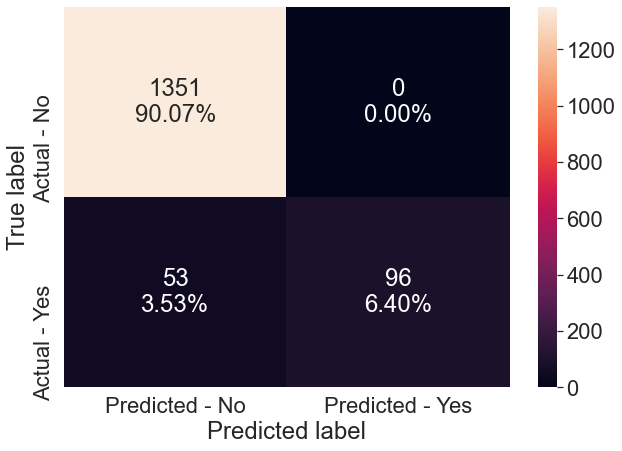

<IPython.core.display.Javascript object>

In [122]:
make_confusion_matrix(dTree1, y_test)

In [123]:
# Accuracy on train and test
print("Accuracy on training set : ", dTree1.score(X_train, y_train))
print("Accuracy on test set : ", dTree1.score(X_test, y_test))
# Recall on train and test
get_recall_score(dTree1)

Accuracy on training set :  0.9782857142857143
Accuracy on test set :  0.9646666666666667
Recall on training set :  0.770392749244713
Recall on test set :  0.6442953020134228


<IPython.core.display.Javascript object>

* Recall on training set has reduced from 1 to 0.77 but this is an improvement but because I got a zero error, I know that the model is still not correct.

## Visualizing the Decision Tree

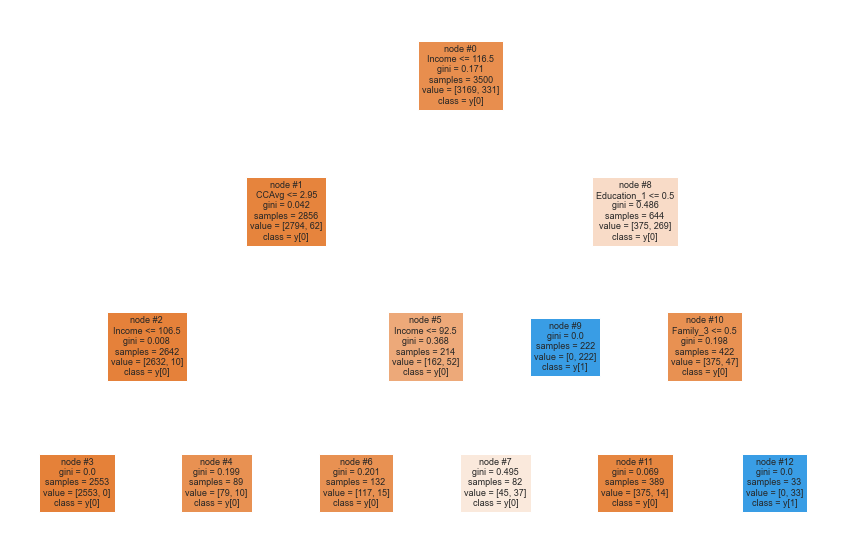

<IPython.core.display.Javascript object>

In [124]:
plt.figure(figsize=(15, 10))

tree.plot_tree(
    dTree1,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
plt.show()

In [125]:
# Text report showing the rules of a decision tree -

print(tree.export_text(dTree1, feature_names=feature_names, show_weights=True))

|--- Income <= 116.50
|   |--- CCAvg <= 2.95
|   |   |--- Income <= 106.50
|   |   |   |--- weights: [2553.00, 0.00] class: 0
|   |   |--- Income >  106.50
|   |   |   |--- weights: [79.00, 10.00] class: 0
|   |--- CCAvg >  2.95
|   |   |--- Income <= 92.50
|   |   |   |--- weights: [117.00, 15.00] class: 0
|   |   |--- Income >  92.50
|   |   |   |--- weights: [45.00, 37.00] class: 0
|--- Income >  116.50
|   |--- Education_1 <= 0.50
|   |   |--- weights: [0.00, 222.00] class: 1
|   |--- Education_1 >  0.50
|   |   |--- Family_3 <= 0.50
|   |   |   |--- weights: [375.00, 14.00] class: 0
|   |   |--- Family_3 >  0.50
|   |   |   |--- weights: [0.00, 33.00] class: 1



<IPython.core.display.Javascript object>

In [126]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        dTree1.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                                    Imp
Education_1                    0.471323
Income                         0.366211
Family_3                       0.115989
CCAvg                          0.046476
Age                            0.000000
County_San Bernardino County   0.000000
County_San Benito County       0.000000
County_Sacramento County       0.000000
County_Riverside County        0.000000
County_Placer County           0.000000
County_Orange County           0.000000
County_Napa County             0.000000
County_San Francisco County    0.000000
County_Monterey County         0.000000
County_Merced County           0.000000
County_Mendocino County        0.000000
County_Marin County            0.000000
County_Los Angeles County      0.000000
County_Lake County             0.000000
County_San Diego County        0.000000
County_San Luis Obispo County  0.000000
County_San Joaquin County      0.000000
County_Imperial County         0.000000
County_San Mateo County        0.000000


<IPython.core.display.Javascript object>

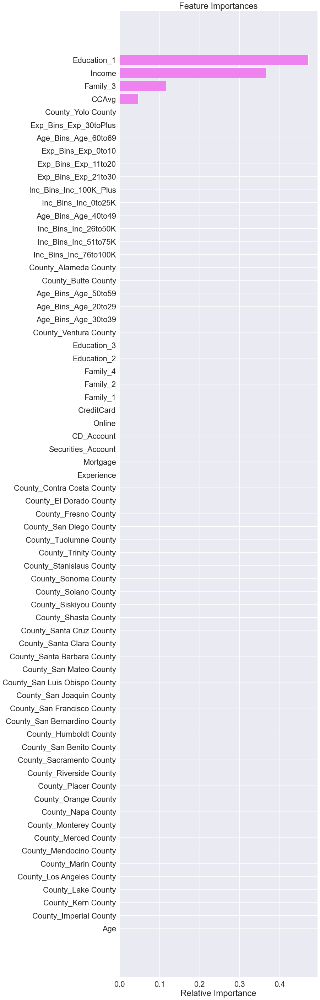

<IPython.core.display.Javascript object>

In [127]:
importances = dTree1.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10, 50))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

### Using GridSearch for Hyperparameter tuning of our tree model

* Hyperparameter tuning is also tricky in the sense that there is no direct way to calculate how a change in the
  hyperparameter value will reduce the loss of your model, so we usually resort to experimentation. i.e we'll use Grid search
* Grid search is a tuning technique that attempts to compute the optimum values of hyperparameters. 
* It is an exhaustive search that is performed on a the specific parameter values of a model.
* The parameters of the estimator/model used to apply these methods are optimized by cross-validated grid-search over a parameter grid.

In [128]:
from sklearn.model_selection import GridSearchCV

<IPython.core.display.Javascript object>

In [129]:
# Choose the type of classifier.
estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "max_depth": np.arange(1, 10),
    "min_samples_leaf": [1, 2, 5, 7, 10, 15, 20],
    "max_leaf_nodes": [2, 3, 5, 10],
    "min_impurity_decrease": [0.001, 0.01, 0.1],
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer, cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data.
estimator.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, max_leaf_nodes=10,
                       min_impurity_decrease=0.001, random_state=1)

<IPython.core.display.Javascript object>

## Confusion Matrix - decision tree with tuned hyperparameters

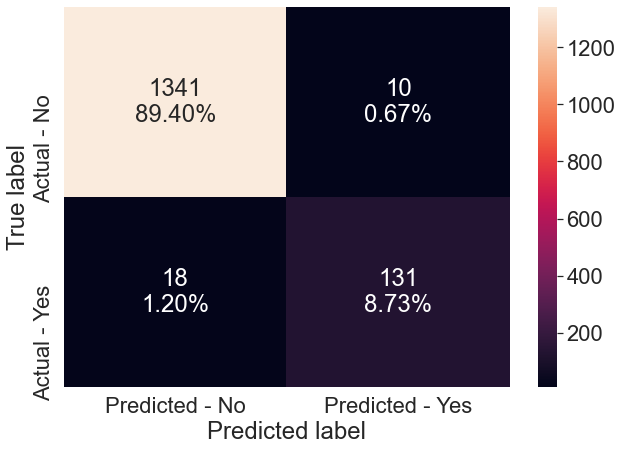

<IPython.core.display.Javascript object>

In [130]:
make_confusion_matrix(estimator, y_test)

In [131]:
# Accuracy on train and test
print("Accuracy on training set : ", estimator.score(X_train, y_train))
print("Accuracy on test set : ", estimator.score(X_test, y_test))
# Recall on train and test
get_recall_score(estimator)

Accuracy on training set :  0.9897142857142858
Accuracy on test set :  0.9813333333333333
Recall on training set :  0.9274924471299094
Recall on test set :  0.8791946308724832


<IPython.core.display.Javascript object>

* After tuning hyperparameters, the performance of the model has become more generalized.

## Visualizing the Decision Tree

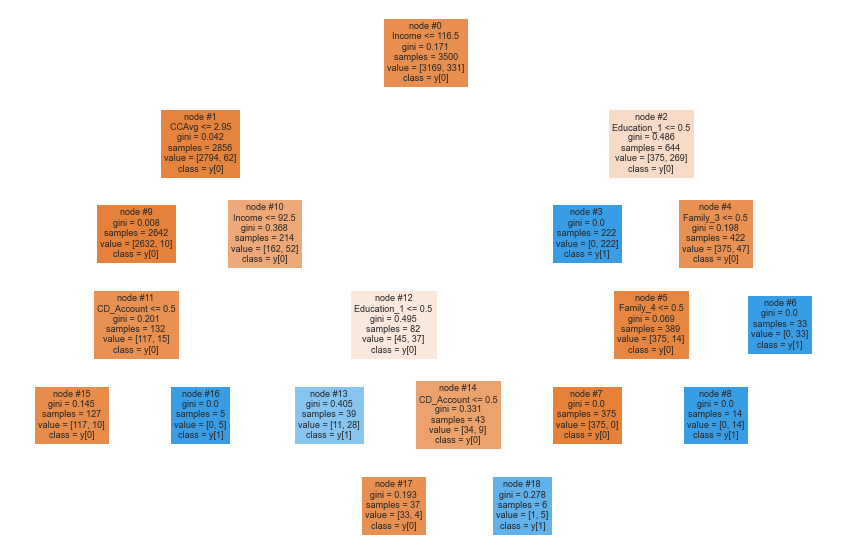

<IPython.core.display.Javascript object>

In [132]:
plt.figure(figsize=(15, 10))

tree.plot_tree(
    estimator,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
plt.show()

In [133]:
# Text report showing the rules of a decision tree -

print(tree.export_text(estimator, feature_names=feature_names, show_weights=True))

|--- Income <= 116.50
|   |--- CCAvg <= 2.95
|   |   |--- weights: [2632.00, 10.00] class: 0
|   |--- CCAvg >  2.95
|   |   |--- Income <= 92.50
|   |   |   |--- CD_Account <= 0.50
|   |   |   |   |--- weights: [117.00, 10.00] class: 0
|   |   |   |--- CD_Account >  0.50
|   |   |   |   |--- weights: [0.00, 5.00] class: 1
|   |   |--- Income >  92.50
|   |   |   |--- Education_1 <= 0.50
|   |   |   |   |--- weights: [11.00, 28.00] class: 1
|   |   |   |--- Education_1 >  0.50
|   |   |   |   |--- CD_Account <= 0.50
|   |   |   |   |   |--- weights: [33.00, 4.00] class: 0
|   |   |   |   |--- CD_Account >  0.50
|   |   |   |   |   |--- weights: [1.00, 5.00] class: 1
|--- Income >  116.50
|   |--- Education_1 <= 0.50
|   |   |--- weights: [0.00, 222.00] class: 1
|   |--- Education_1 >  0.50
|   |   |--- Family_3 <= 0.50
|   |   |   |--- Family_4 <= 0.50
|   |   |   |   |--- weights: [375.00, 0.00] class: 0
|   |   |   |--- Family_4 >  0.50
|   |   |   |   |--- weights: [0.00, 14.00] clas

<IPython.core.display.Javascript object>

In [134]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the 'criterion' brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        estimator.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

# Here we will see that importance of features has increased

                                    Imp
Education_1                    0.447999
Income                         0.328713
Family_3                       0.105394
Family_4                       0.050317
CCAvg                          0.042231
CD_Account                     0.025345
Age                            0.000000
County_San Bernardino County   0.000000
County_San Benito County       0.000000
County_Sacramento County       0.000000
County_Riverside County        0.000000
County_Placer County           0.000000
County_Orange County           0.000000
County_Napa County             0.000000
County_San Francisco County    0.000000
County_Monterey County         0.000000
County_Merced County           0.000000
County_Mendocino County        0.000000
County_Marin County            0.000000
County_Los Angeles County      0.000000
County_San Diego County        0.000000
County_Santa Barbara County    0.000000
County_San Joaquin County      0.000000
County_San Luis Obispo County  0.000000


<IPython.core.display.Javascript object>

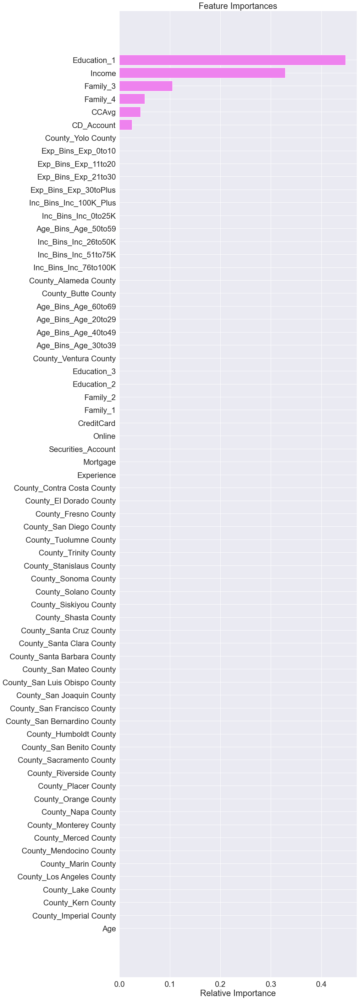

<IPython.core.display.Javascript object>

In [135]:
importances = estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 50))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* You can see in important features of previous model, employment_duration was lost, but here importance of employment_duration variable is back
This shows that hyperparameter tuning using Grid Search is better than randomly limiting a Hyperparameter

* But post pruning might give even better results, since there is quite a good possibility that we might neglect some hyperparameters, post pruning will take care of all that.

## Cost Complexity Pruning

The `DecisionTreeClassifier` provides parameters such as
``min_samples_leaf`` and ``max_depth`` to prevent a tree from overfiting. Cost
complexity pruning provides another option to control the size of a tree. In
`DecisionTreeClassifier`, this pruning technique is parameterized by the
cost complexity parameter, ``ccp_alpha``. Greater values of ``ccp_alpha``
increase the number of nodes pruned. Here we only show the effect of
``ccp_alpha`` on regularizing the trees and how to choose a ``ccp_alpha``
based on validation scores.

Total impurity of leaves vs effective alphas of pruned tree
---------------------------------------------------------------
Minimal cost complexity pruning recursively finds the node with the "weakest
link". The weakest link is characterized by an effective alpha, where the
nodes with the smallest effective alpha are pruned first. To get an idea of
what values of ``ccp_alpha`` could be appropriate, scikit-learn provides
`DecisionTreeClassifier.cost_complexity_pruning_path` that returns the
effective alphas and the corresponding total leaf impurities at each step of
the pruning process. As alpha increases, more of the tree is pruned, which
increases the total impurity of its leaves.

https://online.stat.psu.edu/stat508/lesson/11/11.8/11.8.2

In [136]:
clf = DecisionTreeClassifier(random_state=1)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

<IPython.core.display.Javascript object>

In [137]:
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.000000,0.000000
1,0.000187,0.000562
2,0.000188,0.001127
3,0.000269,0.002202
4,0.000269,0.002740
5,0.000326,0.004371
6,0.000359,0.005447
7,0.000381,0.005828
8,0.000381,0.006209
9,0.000381,0.006590


<IPython.core.display.Javascript object>

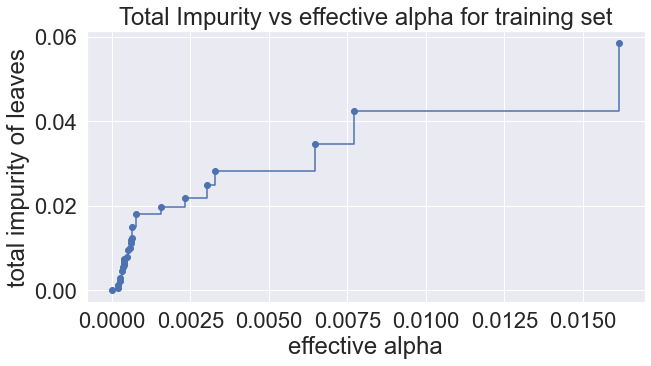

<IPython.core.display.Javascript object>

In [138]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

Next, we train a decision tree using the effective alphas. The last value
in ``ccp_alphas`` is the alpha value that prunes the whole tree,
leaving the tree, ``clfs[-1]``, with one node.

In [139]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.056364969335601575


<IPython.core.display.Javascript object>

For the remainder, we remove the last element in
``clfs`` and ``ccp_alphas``, because it is the trivial tree with only one
node. Here we show that the number of nodes and tree depth decreases as alpha
increases.

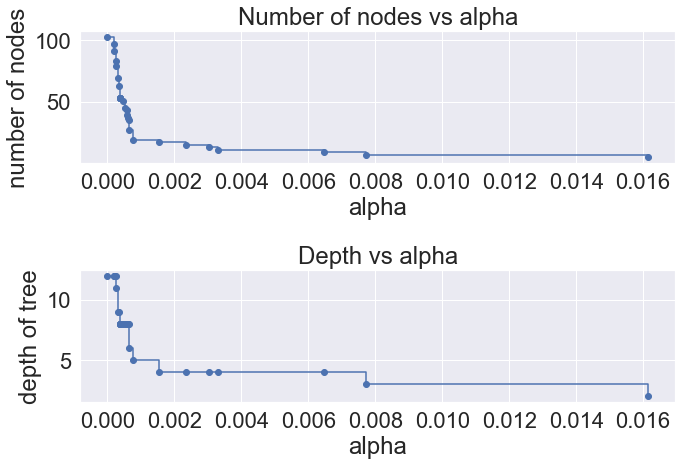

<IPython.core.display.Javascript object>

In [140]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1, figsize=(10, 7))
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

Accuracy vs alpha for training and testing sets
----------------------------------------------------
When ``ccp_alpha`` is set to zero and keeping the other default parameters
of `DecisionTreeClassifier`, the tree overfits, leading to
a 100% training accuracy and 69% testing accuracy. As alpha increases, more
of the tree is pruned, thus creating a decision tree that generalizes better.

In [141]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

<IPython.core.display.Javascript object>

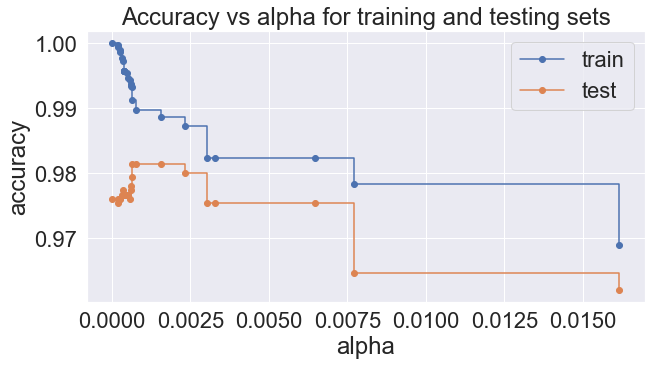

<IPython.core.display.Javascript object>

In [142]:
fig, ax = plt.subplots(figsize=(10, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [143]:
index_best_model = np.argmax(test_scores)
best_model = clfs[index_best_model]
print(best_model)
print("Training accuracy of best model: ", best_model.score(X_train, y_train))
print("Test accuracy of best model: ", best_model.score(X_test, y_test))

DecisionTreeClassifier(ccp_alpha=0.0006414326414326415, random_state=1)
Training accuracy of best model:  0.9911428571428571
Test accuracy of best model:  0.9813333333333333


<IPython.core.display.Javascript object>

#### Since accuracy isn't the right metric for our data we would want high recall

In [144]:
recall_train = []
for clf in clfs:
    pred_train3 = clf.predict(X_train)
    values_train = metrics.recall_score(y_train, pred_train3)
    recall_train.append(values_train)

<IPython.core.display.Javascript object>

In [145]:
recall_test = []
for clf in clfs:
    pred_test3 = clf.predict(X_test)
    values_test = metrics.recall_score(y_test, pred_test3)
    recall_test.append(values_test)

<IPython.core.display.Javascript object>

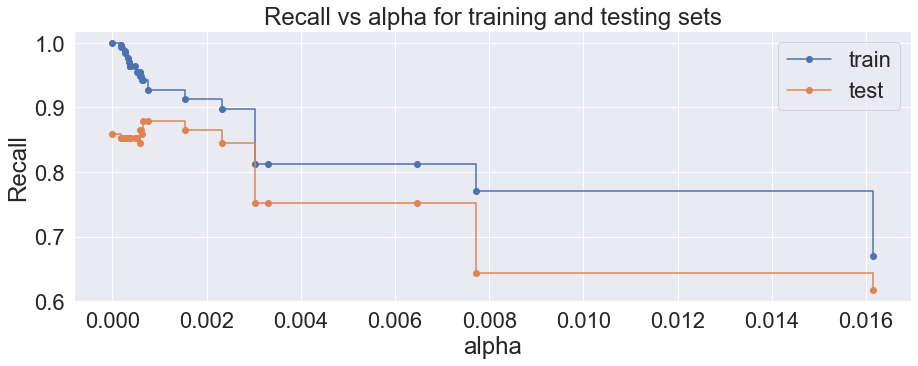

<IPython.core.display.Javascript object>

In [146]:
fig, ax = plt.subplots(figsize=(15, 5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(ccp_alphas, recall_train, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, recall_test, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [147]:
# creating the model where we get highest train and test recall
index_best_model = np.argmax(recall_test)
best_model = clfs[index_best_model]
print(best_model)

DecisionTreeClassifier(ccp_alpha=0.0006414326414326415, random_state=1)


<IPython.core.display.Javascript object>

## Confusion Matrix - post-pruned decision tree

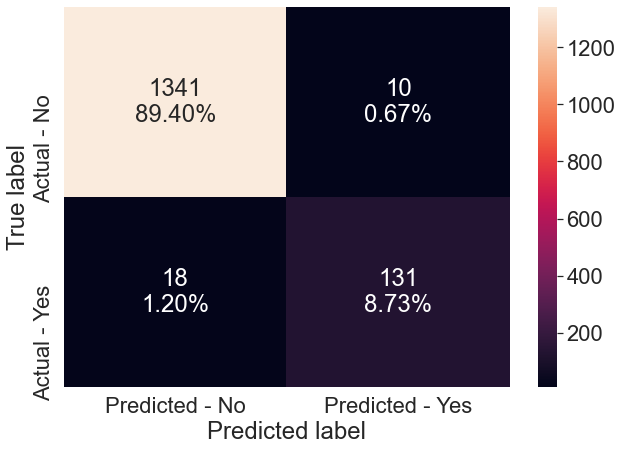

<IPython.core.display.Javascript object>

In [148]:
make_confusion_matrix(best_model, y_test)

In [149]:
# Recall on train and test
get_recall_score(best_model)

Recall on training set :  0.9425981873111783
Recall on test set :  0.8791946308724832


<IPython.core.display.Javascript object>

* With post-pruning we get the highest recall on both training and test set

## Visualizing the Decision Tree

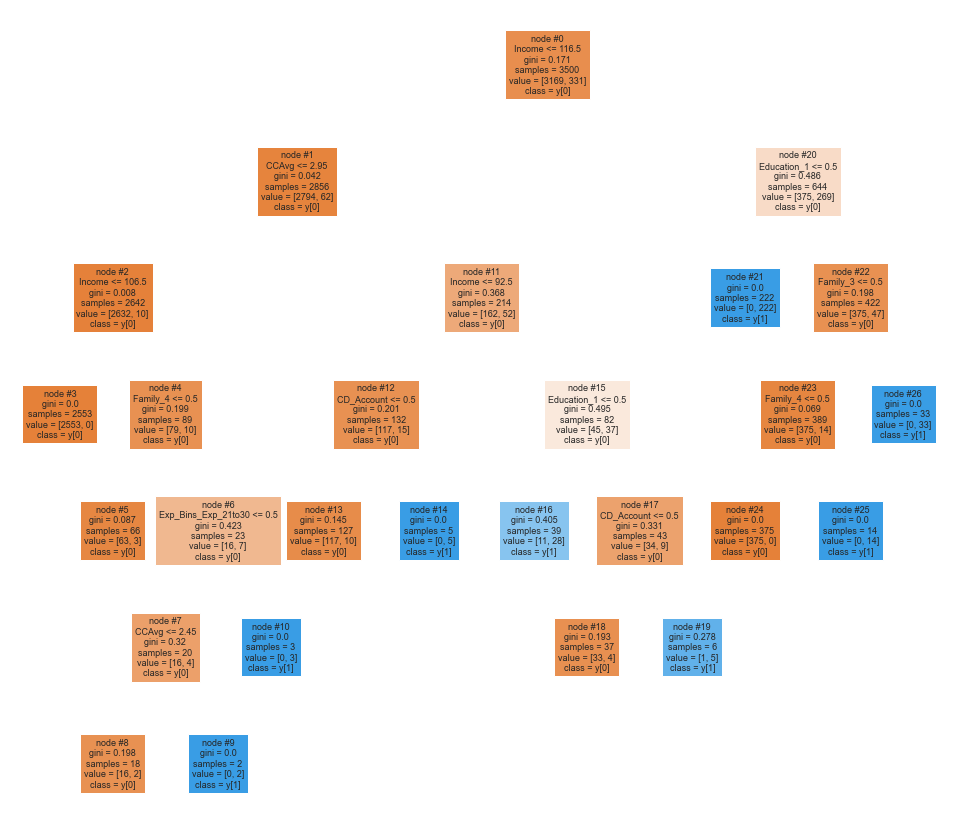

<IPython.core.display.Javascript object>

In [150]:
plt.figure(figsize=(17, 15))

tree.plot_tree(
    best_model,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=True,
    class_names=True,
)
plt.show()

In [151]:
# Text report showing the rules of a decision tree -

print(tree.export_text(best_model, feature_names=feature_names, show_weights=True))

|--- Income <= 116.50
|   |--- CCAvg <= 2.95
|   |   |--- Income <= 106.50
|   |   |   |--- weights: [2553.00, 0.00] class: 0
|   |   |--- Income >  106.50
|   |   |   |--- Family_4 <= 0.50
|   |   |   |   |--- weights: [63.00, 3.00] class: 0
|   |   |   |--- Family_4 >  0.50
|   |   |   |   |--- Exp_Bins_Exp_21to30 <= 0.50
|   |   |   |   |   |--- CCAvg <= 2.45
|   |   |   |   |   |   |--- weights: [16.00, 2.00] class: 0
|   |   |   |   |   |--- CCAvg >  2.45
|   |   |   |   |   |   |--- weights: [0.00, 2.00] class: 1
|   |   |   |   |--- Exp_Bins_Exp_21to30 >  0.50
|   |   |   |   |   |--- weights: [0.00, 3.00] class: 1
|   |--- CCAvg >  2.95
|   |   |--- Income <= 92.50
|   |   |   |--- CD_Account <= 0.50
|   |   |   |   |--- weights: [117.00, 10.00] class: 0
|   |   |   |--- CD_Account >  0.50
|   |   |   |   |--- weights: [0.00, 5.00] class: 1
|   |   |--- Income >  92.50
|   |   |   |--- Education_1 <= 0.50
|   |   |   |   |--- weights: [11.00, 28.00] class: 1
|   |   |   |--- Ed

<IPython.core.display.Javascript object>

In [152]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the 'criterion' brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        best_model.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                                    Imp
Education_1                    0.439285
Income                         0.326289
Family_3                       0.103344
Family_4                       0.053517
CCAvg                          0.046609
CD_Account                     0.024852
Exp_Bins_Exp_21to30            0.006103
County_San Diego County        0.000000
County_San Bernardino County   0.000000
County_San Benito County       0.000000
County_Sacramento County       0.000000
County_Riverside County        0.000000
County_Placer County           0.000000
Age                            0.000000
County_San Francisco County    0.000000
County_Napa County             0.000000
County_Monterey County         0.000000
County_Merced County           0.000000
County_Mendocino County        0.000000
County_Marin County            0.000000
County_Orange County           0.000000
County_Santa Barbara County    0.000000
County_San Joaquin County      0.000000
County_San Luis Obispo County  0.000000


<IPython.core.display.Javascript object>

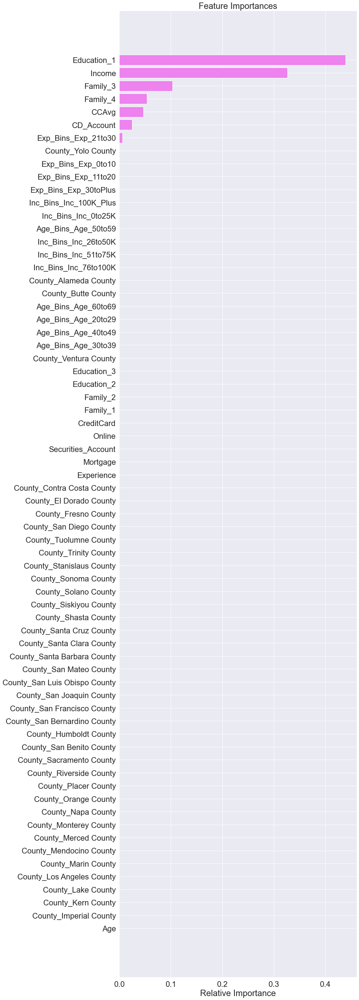

<IPython.core.display.Javascript object>

In [153]:
importances = best_model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 50))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

* Checking balance and Duration of loan are the most important features.

## Comparing all the decision tree models

In [154]:
comparison_frame = pd.DataFrame(
    {
        "Model": [
            "Initial decision tree model",
            "Decision tree with restricted maximum depth",
            "Decision treee with hyperparameter tuning",
            "Decision tree with post-pruning",
        ],
        "Train_Recall": [1, 0.77, 0.92, 0.94],
        "Test_Recall": [0.85, 0.64, 0.88, 0.88],
    }
)
comparison_frame

,Model,Train_Recall,Test_Recall
0,Initial decision tree model,1.00,0.85
1,Decision tree with restricted maximum depth,0.77,0.64
2,Decision treee with hyperparameter tuning,0.92,0.88
3,Decision tree with post-pruning,0.94,0.88


<IPython.core.display.Javascript object>

**Decision tree with post-pruning is giving the highest recall on test set.**

## Observations

We can use these models to predict whether a customer will or will not buy a loan. In both models we were able to see that someone with an undergraduate education and a family with 3 to 4 members were the deciding factors to look at along with income on whether someone was going to purchase a loan or not. If I was going to evaluate this model further, I would want to use the map I created to pinpoint where these customer reside. Then I would want to look at the branches in those areas to run the campaign. 

We were able to see there were some counties that had a low enough p-value to have some significance. I would start looking at those counties first and see if the variables of undergraduate education with 3 to 4 family members resided there. I also would want to rerun the logistic regression model before submitting a formal recommendation to the CEO/CFO. I believe I could build a stronger model by changing the variables I dropped. 